In [1]:
import pandas as pd
import matplotlib.pyplot as plt


In [218]:
zip_4bd = pd.read_csv('./project1/Zip_zhvi_bdrmcnt_4_uc_sfrcondo_tier_0.33_0.67_sm_sa_mon.csv')
nb_4bd = pd.read_csv('./project1/Neighborhood_zhvi_bdrmcnt_4_uc_sfrcondo_tier_0.33_0.67_sm_sa_mon.csv')
metro_4bd = pd.read_csv('./project1/Metro_zhvi_bdrmcnt_4_uc_sfrcondo_tier_0.33_0.67_sm_sa_mon.csv')
single = pd.read_csv('./project1/Zip_zhvi_uc_sfr_tier_0.33_0.67_sm_sa_mon.csv')
all_top = pd.read_csv('./project1/City_zhvi_uc_sfrcondo_tier_0.67_1.0_sm_sa_mon.csv')
all_bottom = pd.read_csv('./project1/City_zhvi_uc_sfrcondo_tier_0.0_0.33_sm_sa_mon.csv')
zip_3bd = pd.read_csv('./project1/Zip_zhvi_bdrmcnt_3_uc_sfrcondo_tier_0.33_0.67_sm_sa_mon.csv')
zip_2bd = pd.read_csv('./project1/Zip_zhvi_bdrmcnt_2_uc_sfrcondo_tier_0.33_0.67_sm_sa_mon.csv')
zip_1bd = pd.read_csv('./project1/Zip_zhvi_bdrmcnt_1_uc_sfrcondo_tier_0.33_0.67_sm_sa_mon.csv')
zip_condo = pd.read_csv('./project1/Zip_zhvi_uc_condo_tier_0.33_0.67_sm_sa_mon.csv')


In [249]:
print('zip_4bd shape    --> ', zip_4bd.shape)
print('zip_3bd shape    --> ', zip_3bd.shape)
print('zip_2bd shape    --> ', zip_2bd.shape)
print('zip_1bd shape    --> ', zip_1bd.shape)
print('zip_condo shape  --> ', zip_condo.shape)

print('nb_4bd shape     --> ', nb_4bd.shape)
print('metro_4bd shape  --> ', metro_4bd.shape)
print('single shape     --> ', single.shape)
print('all_top shape    --> ', all_top.shape)
print('all_bottom shape --> ', all_bottom.shape)


zip_4bd shape    -->  (27037, 313)
zip_3bd shape    -->  (29225, 313)
zip_2bd shape    -->  (27560, 313)
zip_1bd shape    -->  (19881, 313)
zip_condo shape  -->  (10924, 313)
nb_4bd shape     -->  (15038, 313)
metro_4bd shape  -->  (910, 309)
single shape     -->  (30811, 313)
all_top shape    -->  (26251, 312)
all_bottom shape -->  (26111, 312)


## 1. Methods

In [156]:
def create_plot_data(source):
    price_transposed = source.iloc[:, 9:].transpose()
    price_transposed['month'] = pd.to_datetime(price_transposed.index, format='%Y-%m-%d')
    price_transposed.set_index(['month'], inplace=True)
    
    columns = source.RegionName
    cities = source.City
    
    price_transposed.rename(columns=columns, inplace=True)
    look_up = pd.DataFrame({'zipcode': columns, 'city': cities})
    look_up.set_index(['zipcode'], inplace=True)
    
    return price_transposed, look_up

In [396]:
def rename_columns(plt_data_multi, look_up):
    # Process dataframe from plot_house_price
    sortCity = look_up.sort_values(by=['city'])
    prev = sortCity.iloc[0,0]
    idx = 0
    increment = 0
    for i in range(sortCity.shape[0]):
        cur = sortCity.iloc[i,0]
        if (i > idx and prev == cur):
            increment += 1
            sortCity.iloc[i,0] = prev + str(increment)
        else:
            increment = 0
            prev = cur
    for col in plt_data_multi.columns:
        plt_data_multi.rename(columns={col: sortCity[sortCity.index == col].iloc[0,0]}, inplace=True)
    return plt_data_multi

In [449]:
def plot_house_price_1(data, cities):
    # Create plot data for multiple school districts
    data_multi = data[data['City'].isin(cities)]
    plt_data_multi, look_up = create_plot_data(data_multi)
    
    plt_data = rename_columns(plt_data_multi, look_up)
    plot_city(plt_data, cities)
    
    return plt_data

In [450]:
def plot_house_price_2(data, cities):
    # Create plot data for multiple school districts
    data_multi = data[data['RegionName'].isin(cities)]
    data_multi.insert(8, 'City', data_multi['RegionName'].to_list())
    data_multi.rename(columns={'RegionName':'City2'}, inplace=True)
    data_multi.rename(columns={'RegionID':'RegionName'}, inplace=True)
    plt_data_multi, look_up = create_plot_data(data_multi)
    
    plt_data = rename_columns(plt_data_multi, look_up)
    plot_city(plt_data, cities)
    
    return plt_data

In [409]:
def plot_city(data, cities):
    cols = data.columns
    styles = ['*r', '-r', '-.r', ':r', '--r', '-g', '-.g', '--g', ':g', '-c', '-.c', ':c', '--c', '-b', '-.b', ':b', '--b']
    plt.figure(figsize=(10, 6))
    for idx, city in enumerate(cities):
        if city in cols:
            plt.plot(data.index, data[city], styles[idx], label=city)
    plt.legend(loc='upper left')
    plt.show()

In [544]:
def plot_hist(data):
    plt.figure(figsize=(10, 6))
    data.plot.hist(bins=20, alpha=0.5)
    plt.show()

In [404]:
def rolling_volatility(data, window_size):
    # In typical finance questions, people quote volatility in annualized terms of percent changes in price.
    # Assuming daily / monthly prices in a df, there are n trading sessions in a year
    # Volatility = df.pct_change().rolling(window_size).std()*(n**0.5)
    return data.pct_change().rolling(window_size).std(ddof=0)*(12**0.5)

## 2. Select data

### 2.1 Choose New England States
- Maine (ME) 
- Vermont (VT)
- New Hampshire (NH)
- Massachusetts (MA)
- Connecticut (CT)
- Rhode Island (RI)

In [447]:
states = ['CT', 'NH', 'MA', 'ME', 'RI', 'VT']

NE_condo = zip_condo[zip_condo['StateName'].isin(states)]
NE_1bd = zip_1bd[zip_1bd['StateName'].isin(states)]
NE_2bd = zip_2bd[zip_2bd['StateName'].isin(states)]
NE_3bd = zip_3bd[zip_3bd['StateName'].isin(states)]
NE_4bd = zip_4bd[zip_4bd['StateName'].isin(states)]
NE_single = single[single['StateName'].isin(states)]

print('NE_condo  size --> ', NE_condo.shape)
print('NE_1bd    size --> ', NE_1bd.shape)
print('NE_2bd    size --> ', NE_2bd.shape)
print('NE_3bd    size --> ', NE_3bd.shape)
print('NE_4bd    size --> ', NE_4bd.shape)
print('NE_single size --> ', NE_single.shape)

NE_condo  size -->  (973, 313)
NE_1bd    size -->  (1323, 313)
NE_2bd    size -->  (1643, 313)
NE_3bd    size -->  (1706, 313)
NE_4bd    size -->  (1628, 313)
NE_single size -->  (1755, 313)


In [485]:
NE_top = all_top[all_top['StateName'].isin(states)]
NE_bottom = all_bottom[all_bottom['StateName'].isin(states)]

print('NE_top    size --> ', NE_top.shape)
print('NE_bottom size --> ', NE_bottom.shape)

NE_top    size -->  (1596, 312)
NE_bottom size -->  (1587, 312)


In [448]:
cities_school_CT = ['Darien', 'Weston', 'Westport', 'New Cannaan', 'Wilton', 'Ridgefield', 'East Hartford']
cities_school_NH = ['Contoocook', 'Hanover', 'Windham', 'Hollis', 'Bedford', 'Durham']
cities_school_MA = ['Marlborough', 'Saugus', 'Dover', 'Weston']
cities_school_ME = ['Cape Elizabeth']
cities_school_RI = ['Providence', 'Barrington', 'East Greenwich']
cities_school_VT = ['South Burlington', 'Norwich']

### 2.2 Pin-point to New Hampshire & Vermont area

In [108]:
VTNH_condo = zip_condo[zip_condo['StateName'].isin(['VT', 'NH'])]
VTNH_1bd = zip_1bd[zip_1bd['StateName'].isin(['VT', 'NH'])]
VTNH_2bd = zip_2bd[zip_2bd['StateName'].isin(['VT', 'NH'])]
VTNH_3bd = zip_3bd[zip_3bd['StateName'].isin(['VT', 'NH'])]
VTNH_4bd = zip_4bd[zip_4bd['StateName'].isin(['VT', 'NH'])]
VTNH_single = single[single['StateName'].isin(['VT', 'NH'])]

In [250]:
VTNH_top = all_top[all_top['StateName'].isin(['VT', 'NH'])]
VTNH_bottom = all_bottom[all_bottom['StateName'].isin(['VT', 'NH'])]

In [567]:
cities = ['Hanover', 'Norwich', 'Stowe', 'Bedford', 'Sunapee', 'Lebanon', 'Hartford', 'Plymouth', 'Warner', 'Burlington', 'Nashua', 'Manchester', 'Merrimack', 'Portsmouth', 'Salem', 'Windsor', 'Woodstock']

cities_school = ['', 'Hanover','','','', 'Norwich','','','', 'Stowe','','','', 'Bedford']
cities_normal = ['', 'Lebanon','','','', 'Hartford','','','', 'Plymouth','','','', 'Warner']
cities_large = ['', 'Burlington','','','', 'Nashua','','','', 'Manchester','','','', 'Merrimack']
cities_scene = ['', 'Portsmouth','','','', 'Salem','','','', 'Windsor','','','', 'Woodstock']

## 3. Plots

### 3.1 Chosen cities with best schools for comparison in New England six states

cities_school_CT = ['Darien', 'Weston', 'Westport', 'New Cannaan', 'Wilton', 'Ridgefield', 'East Hartford'] <br />
cities_school_NH = ['Contoocook', 'Hanover', 'Windham', 'Hollis', 'Bedford', 'Durham'] <br />
cities_school_MA = ['Marlborough', 'Saugus', 'Dover', 'Weston'] <br />
cities_school_ME = ['Cape Elizabeth'] <br />
cities_school_RI = ['Providence', 'Barrington', 'East Greenwich'] <br />
cities_school_VT = ['South Burlington', 'Norwich'] <br />

In [581]:
# RI - CT - MA
cities_South = ['', 'Providence', 'Barrington', 'East Greenwich', 'Darien', 'Weston', 'Westport', 'New Cannaan', 'Wilton', 'Ridgefield', 'East Hartford', 'Marlborough', 'Saugus', 'Dover', 'Weston']
# ME - NH - VT
cities_North = ['', 'Cape Elizabeth', 'Contoocook', 'Hanover', 'Windham', 'Hollis', 'Bedford', 'Durham', 'South Burlington', 'Norwich']

### 3.1.1 Compare 4 bedroom houses

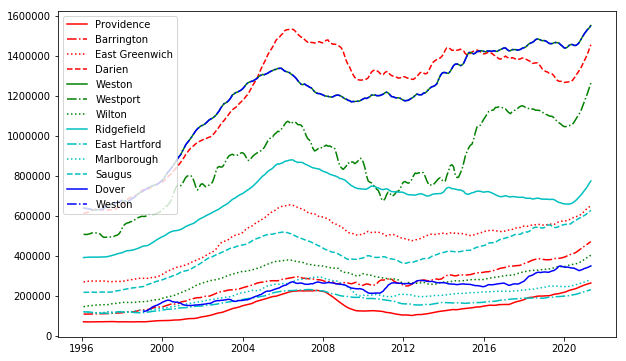

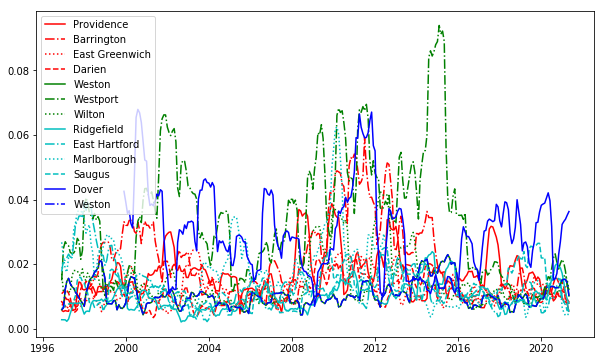

In [490]:
NE_S_4bd = plot_house_price_1(NE_4bd, cities_South)
rolling_NE_S_4bd = rolling_volatility(NE_S_4bd, 10)
plot_city(rolling_NE_S_4bd, cities_South)

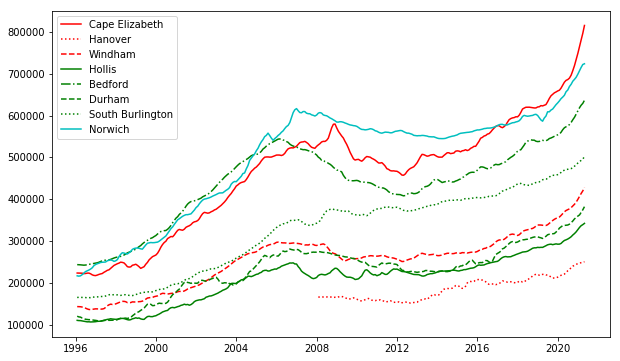

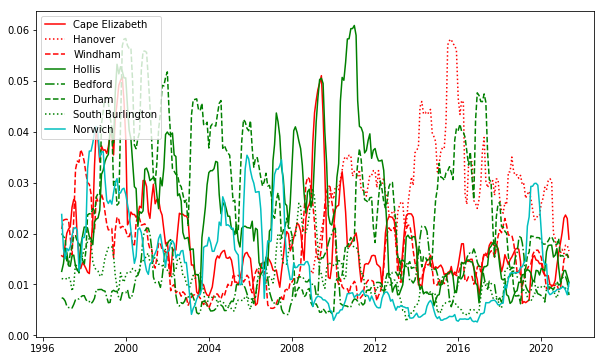

In [491]:
NE_N_4bd = plot_house_price_1(NE_4bd, cities_North)
rolling_NE_N_4bd = rolling_volatility(NE_N_4bd, 10)
plot_city(rolling_NE_N_4bd, cities_North)

### 3.1.2 Compare 3 bedroom houses

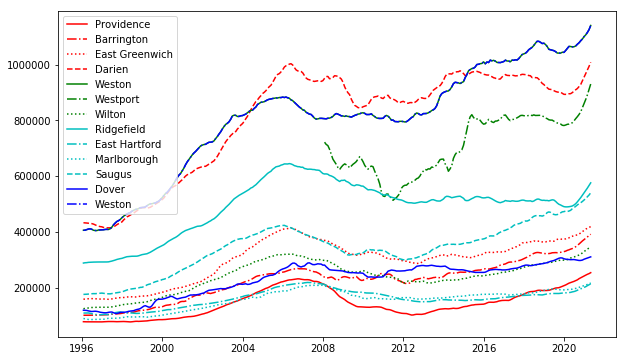

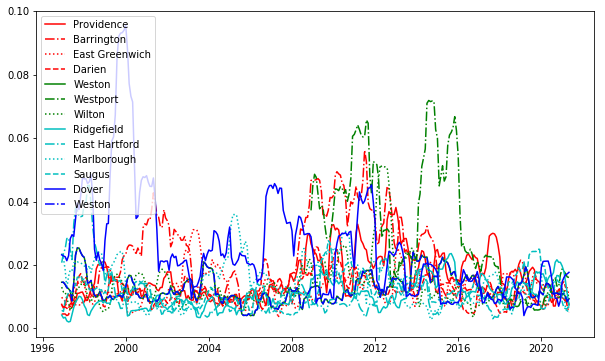

In [493]:
NE_S_3bd = plot_house_price_1(NE_3bd, cities_South)
rolling_NE_S_3bd = rolling_volatility(NE_S_3bd, 10)
plot_city(rolling_NE_S_3bd, cities_South)

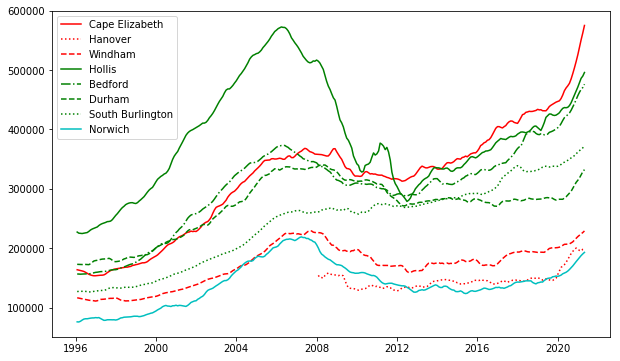

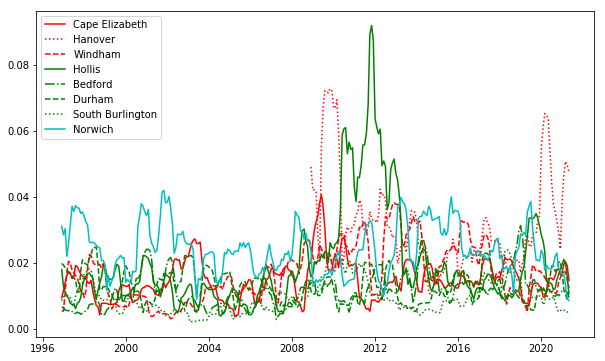

In [494]:
NE_N_3bd = plot_house_price_1(NE_3bd, cities_North)
rolling_NE_N_3bd = rolling_volatility(NE_N_3bd, 10)
plot_city(rolling_NE_N_3bd, cities_North)

### 3.1.3 Compare 2 bedroom houses

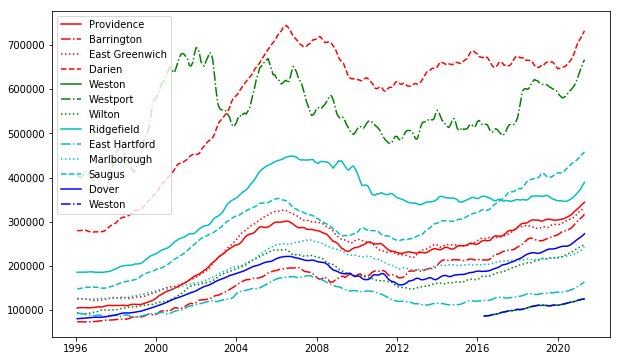

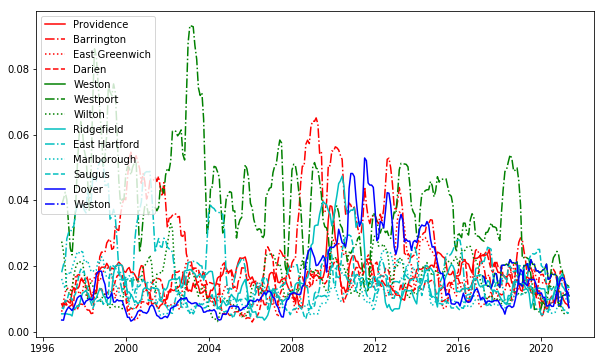

In [495]:
NE_S_2bd = plot_house_price_1(NE_2bd, cities_South)
rolling_NE_S_2bd = rolling_volatility(NE_S_2bd, 10)
plot_city(rolling_NE_S_2bd, cities_South)

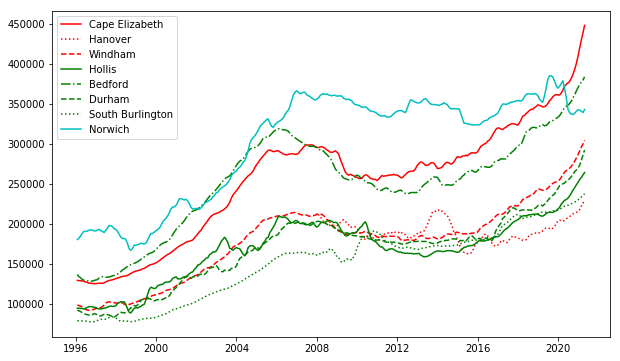

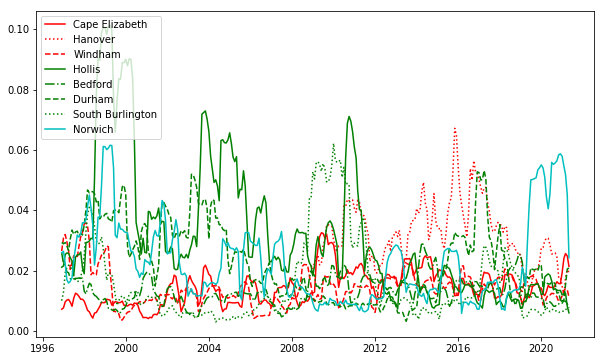

In [496]:
NE_N_2bd = plot_house_price_1(NE_2bd, cities_North)
rolling_NE_N_2bd = rolling_volatility(NE_N_2bd, 10)
plot_city(rolling_NE_N_2bd, cities_North)

### 3.1.4 Compare 1 bedroom houses

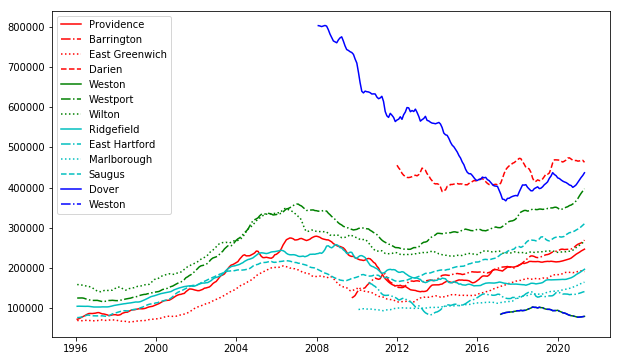

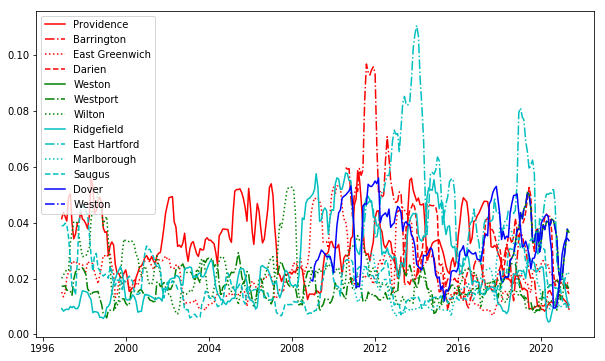

In [497]:
NE_S_1bd = plot_house_price_1(NE_1bd, cities_South)
rolling_NE_S_1bd = rolling_volatility(NE_S_1bd, 10)
plot_city(rolling_NE_S_1bd, cities_South)

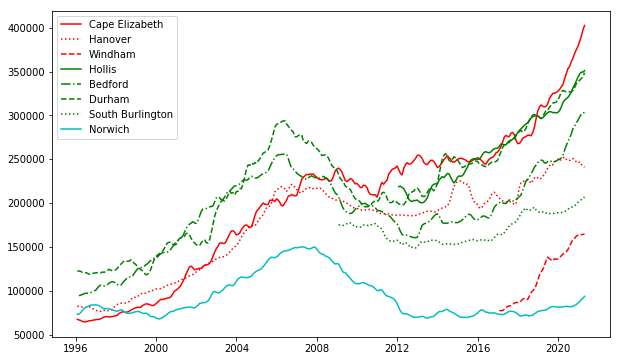

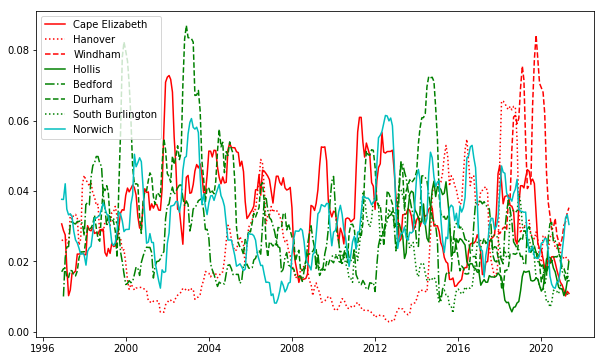

In [498]:
NE_N_1bd = plot_house_price_1(NE_1bd, cities_North)
rolling_NE_N_1bd = rolling_volatility(NE_N_1bd, 10)
plot_city(rolling_NE_N_1bd, cities_North)

### 3.1.5 Compare single houses

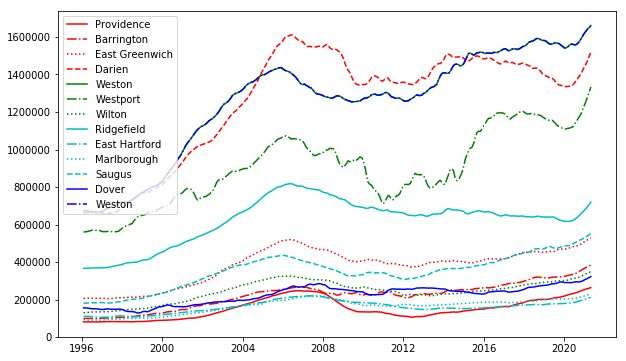

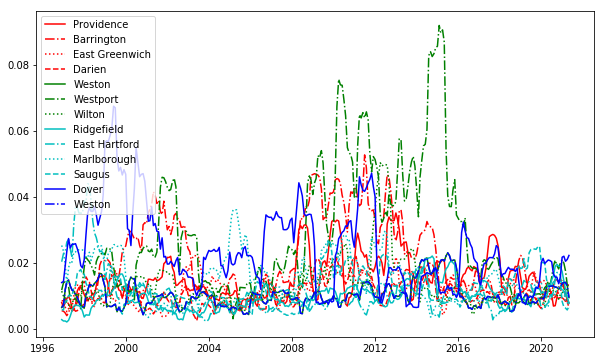

In [584]:
NE_S_single = plot_house_price_1(NE_single, cities_South)
rolling_NE_S_single = rolling_volatility(NE_S_single, 10)
plot_city(rolling_NE_S_single, cities_South)

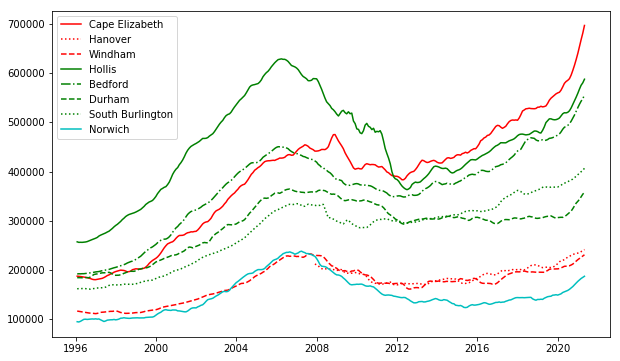

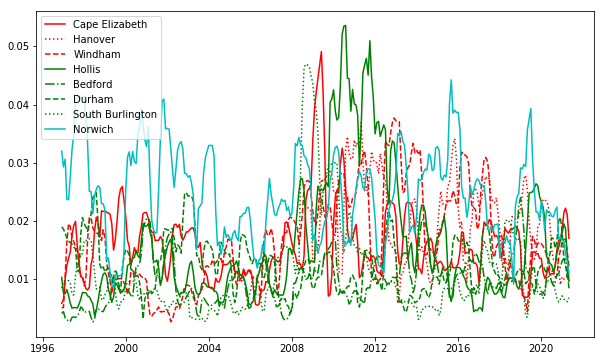

In [585]:
NE_N_single = plot_house_price_1(NE_single, cities_North)
rolling_NE_N_single = rolling_volatility(NE_N_single, 10)
plot_city(rolling_NE_N_single, cities_North)

<Figure size 720x432 with 0 Axes>

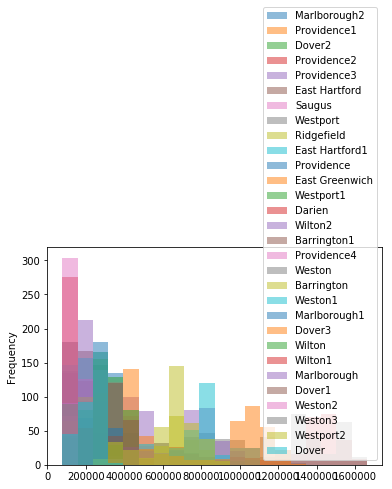

<Figure size 720x432 with 0 Axes>

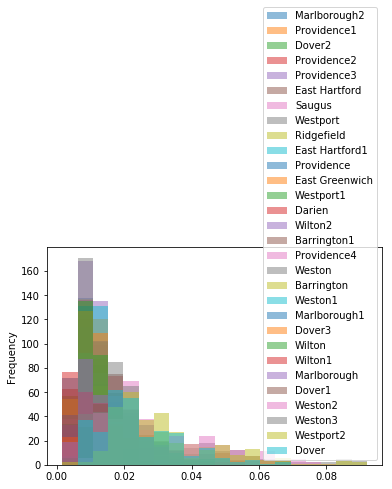

<Figure size 720x432 with 0 Axes>

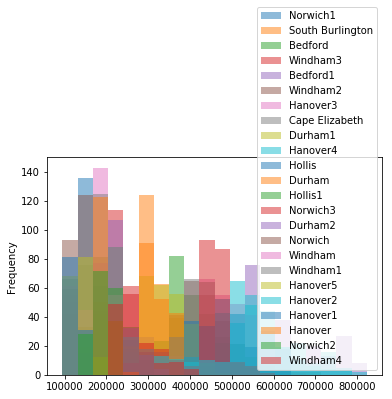

<Figure size 720x432 with 0 Axes>

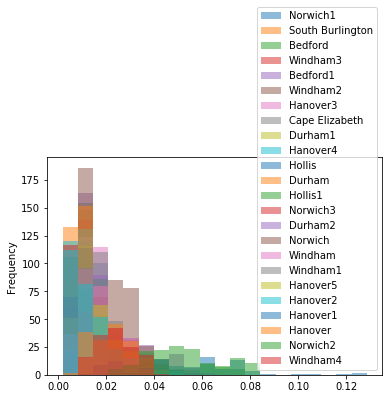

In [586]:
plot_hist(NE_S_single)
plot_hist(rolling_NE_S_single)
plot_hist(NE_N_single)
plot_hist(rolling_NE_N_single)

### 3.1.6 Compare condo houses

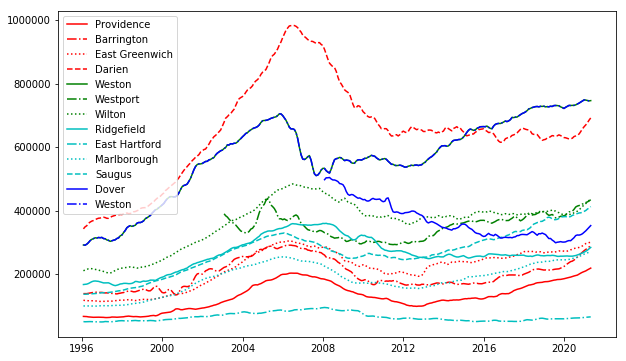

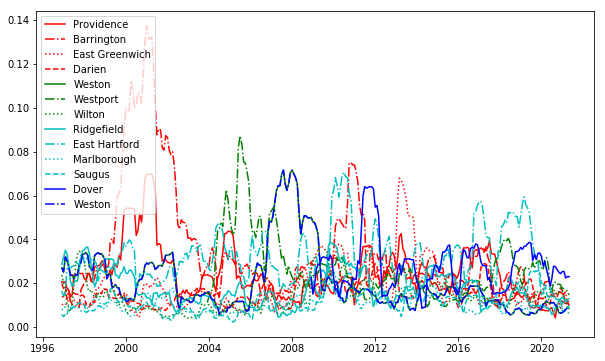

In [501]:
NE_S_condo = plot_house_price_1(NE_condo, cities_South)
rolling_NE_S_condo = rolling_volatility(NE_S_condo, 10)
plot_city(rolling_NE_S_condo, cities_South)

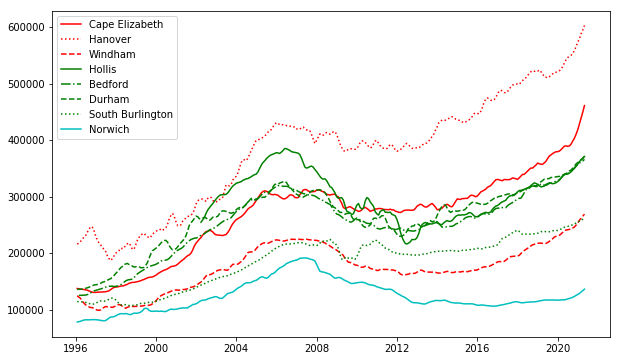

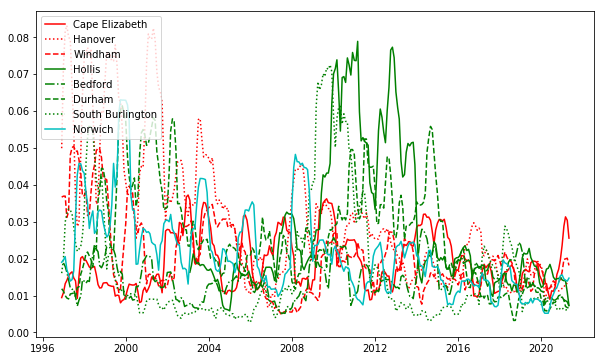

In [502]:
NE_N_condo = plot_house_price_1(NE_condo, cities_North)
rolling_NE_N_condo = rolling_volatility(NE_N_condo, 10)
plot_city(rolling_NE_N_condo, cities_North)

<Figure size 720x432 with 0 Axes>

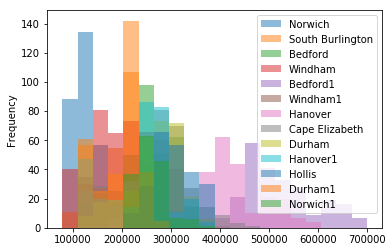

<Figure size 720x432 with 0 Axes>

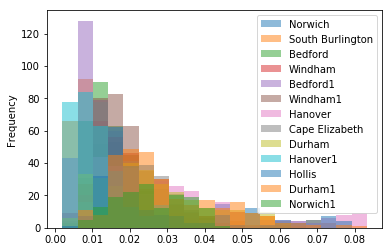

In [553]:
plot_hist(NE_N_condo)
plot_hist(rolling_NE_N_condo)

<Figure size 720x432 with 0 Axes>

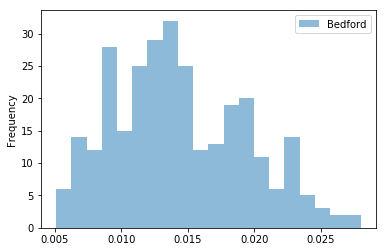

In [552]:
plot_hist(rolling_NE_N_condo[['Bedford']])

In [579]:
tt = 'abc'
lst = ['abc', 'cdd']
output=''
if tt in lst:
    output='yes'

print(output)

yes


### 3.1.7 Compare top-priced houses

/Users/bouyang/Documents/virtualenv/atlas/lib/python3.7/site-packages/pandas/core/frame.py:4025: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


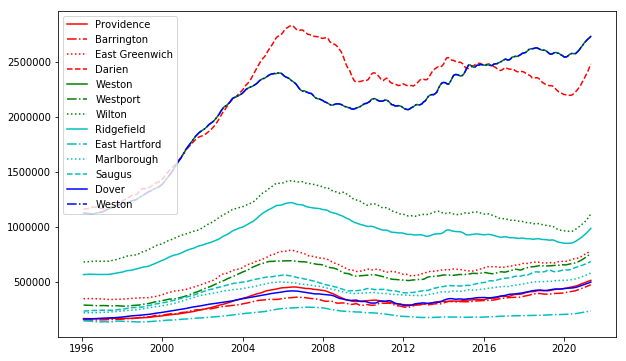

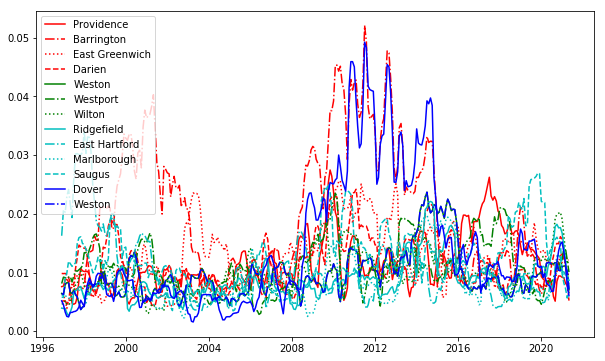

In [510]:
NE_S_top = plot_house_price_2(NE_top, cities_South)
rolling_NE_S_top = rolling_volatility(NE_S_top, 10)
plot_city(rolling_NE_S_top, cities_South)

/Users/bouyang/Documents/virtualenv/atlas/lib/python3.7/site-packages/pandas/core/frame.py:4025: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


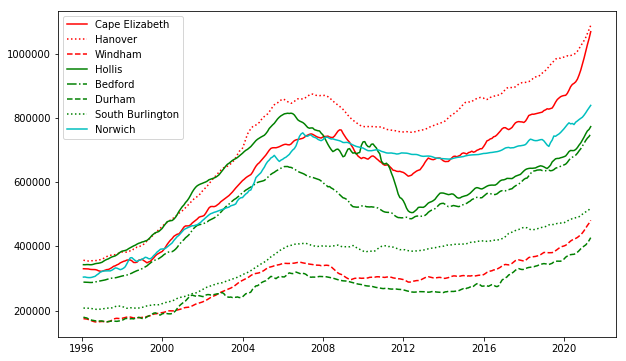

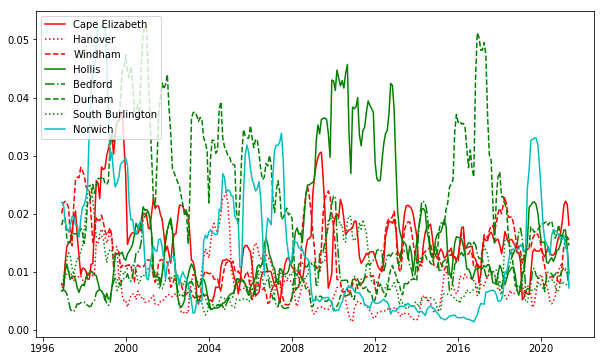

In [511]:
NE_N_top = plot_house_price_2(NE_top, cities_North)
rolling_NE_N_top = rolling_volatility(NE_N_top, 10)
plot_city(rolling_NE_N_top, cities_North)

<Figure size 720x432 with 0 Axes>

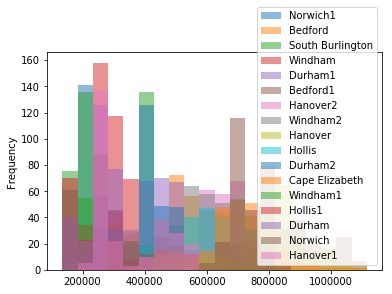

<Figure size 720x432 with 0 Axes>

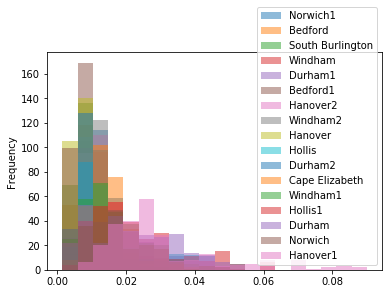

In [554]:
plot_hist(NE_N_top)
plot_hist(rolling_NE_N_top)

### 3.1.8 Compare bottom-priced houses

/Users/bouyang/Documents/virtualenv/atlas/lib/python3.7/site-packages/pandas/core/frame.py:4025: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


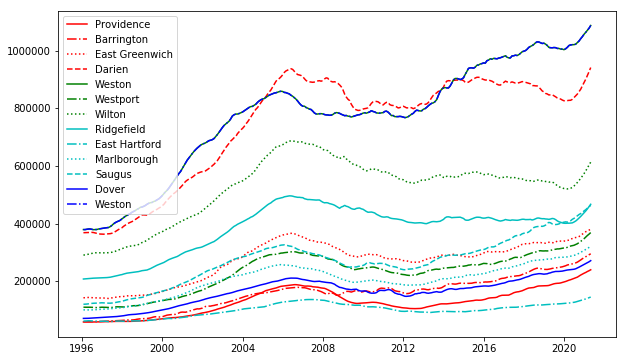

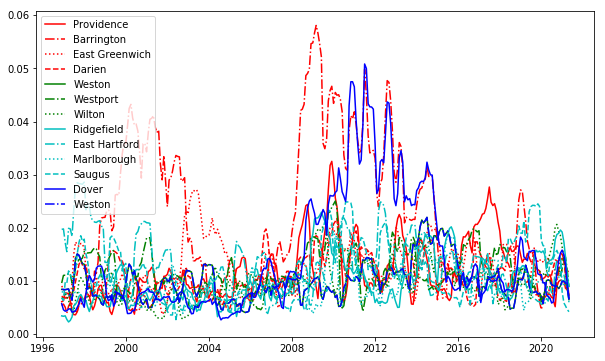

In [513]:
NE_S_bottom = plot_house_price_2(NE_bottom, cities_South)
rolling_NE_S_bottom = rolling_volatility(NE_S_bottom, 10)
plot_city(rolling_NE_S_bottom, cities_South)

/Users/bouyang/Documents/virtualenv/atlas/lib/python3.7/site-packages/pandas/core/frame.py:4025: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


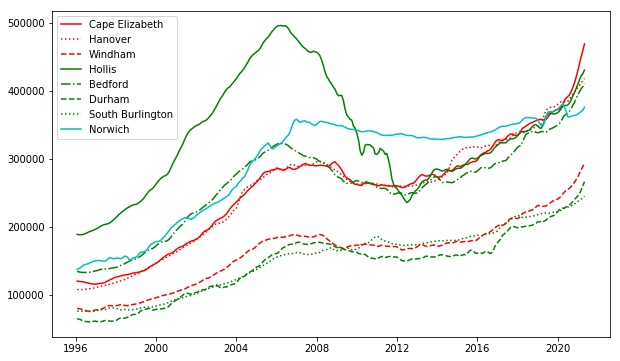

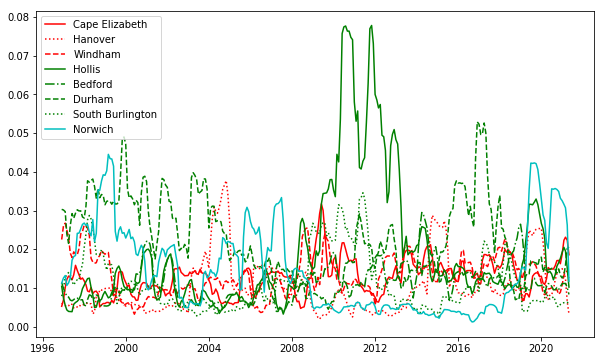

In [514]:
NE_N_bottom = plot_house_price_2(NE_bottom, cities_North)
rolling_NE_N_bottom = rolling_volatility(NE_N_bottom, 10)
plot_city(rolling_NE_N_bottom, cities_North)

<Figure size 720x432 with 0 Axes>

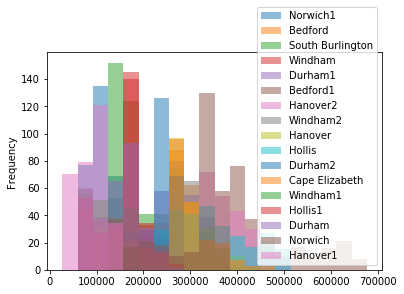

<Figure size 720x432 with 0 Axes>

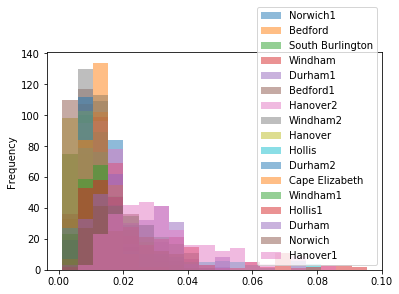

In [558]:
plot_hist(NE_N_bottom)
plot_hist(rolling_NE_N_bottom)

### 3.2 Chosen richest cities for comparison in New England six states

cities_rich_CT = ['New Canaan', 'Darien', 'Greenwich', 'Weston'] <br />
`# Connecticut excluded because it's richest cities are overlapping with it's cities with best schools` <br />
cities_rich_NH = ['Hampton Falls', 'Bedford', 'Amherst', 'Brookline'] <br />
cities_rich_MA = ['Weston', 'Dover', 'Lexington', 'Carlisle'] <br />
cities_rich_ME = ['Saco', 'South Portland', 'Belfast', 'Portland'] <br />
cities_rich_RI = ['Barrington', 'Jamestown', 'East Greenwich', 'Little Compton'] <br />
cities_rich_VT = ['Essex Junction', 'Montpelier', 'South Burlington', 'Vergennes'] <br />

In [523]:
# RI - MA
cities_South = ['', 'Weston', 'Dover', 'Lexington', 'Carlisle', 'Barrington', 'Jamestown', 'East Greenwich', 'Little Compton']
# ME - NH - VT
cities_North = ['', 'Saco', 'South Portland', 'Belfast', 'Portland', 'Hampton Falls', 'Bedford', 'Amherst', 'Brookline', 'Essex Junction', 'Montpelier', 'South Burlington', 'Vergennes']

### 3.2.1 Compare 4 bedroom houses

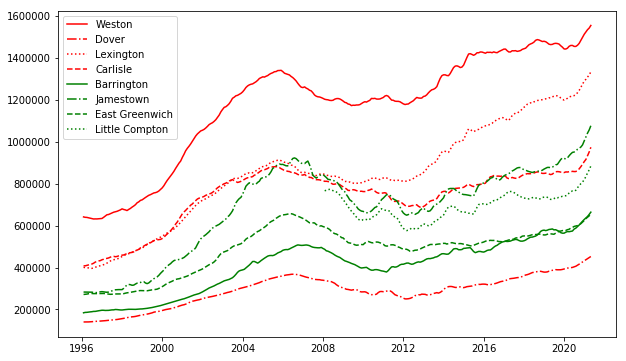

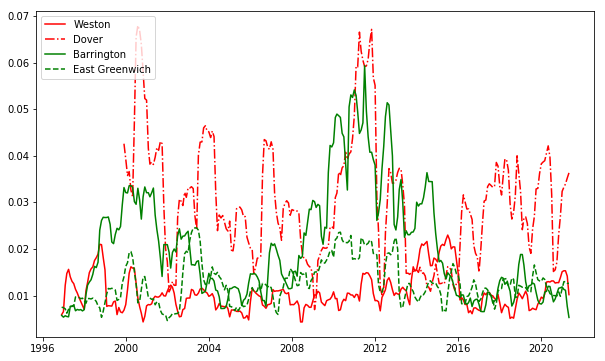

In [524]:
NE_S2_4bd = plot_house_price_1(NE_4bd, cities_South)
rolling_NE_S2_4bd = rolling_volatility(NE_S_4bd, 10)
plot_city(rolling_NE_S2_4bd, cities_South)

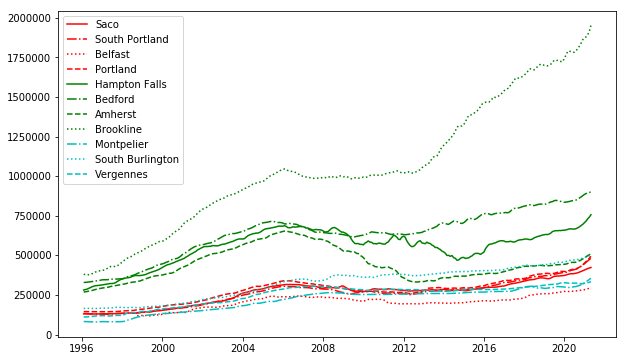

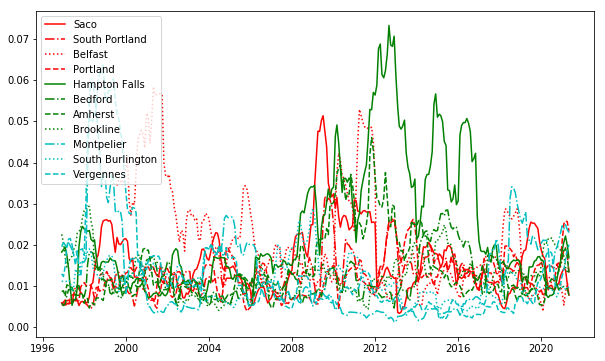

In [525]:
NE_N2_4bd = plot_house_price_1(NE_4bd, cities_North)
rolling_NE_N2_4bd = rolling_volatility(NE_N2_4bd, 10)
plot_city(rolling_NE_N2_4bd, cities_North)

<Figure size 720x432 with 0 Axes>

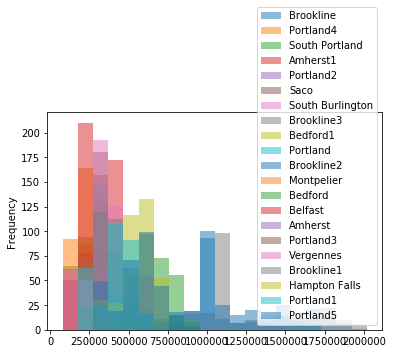

<Figure size 720x432 with 0 Axes>

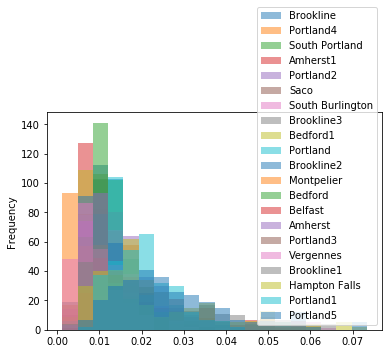

In [559]:
plot_hist(NE_N2_4bd)
plot_hist(rolling_NE_N2_4bd)

### 3.2.2 Compare 3 bedroom houses

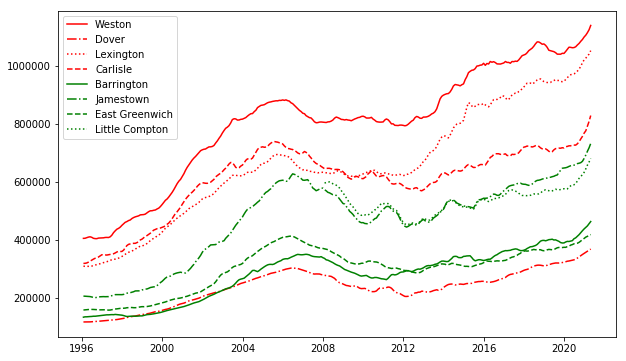

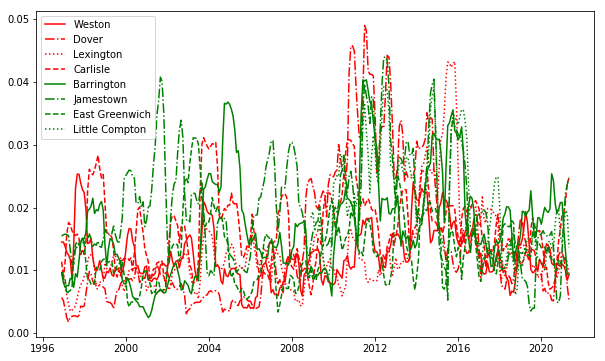

In [526]:
NE_S2_3bd = plot_house_price_1(NE_3bd, cities_South)
rolling_NE_S2_3bd = rolling_volatility(NE_S2_3bd, 10)
plot_city(rolling_NE_S2_3bd, cities_South)

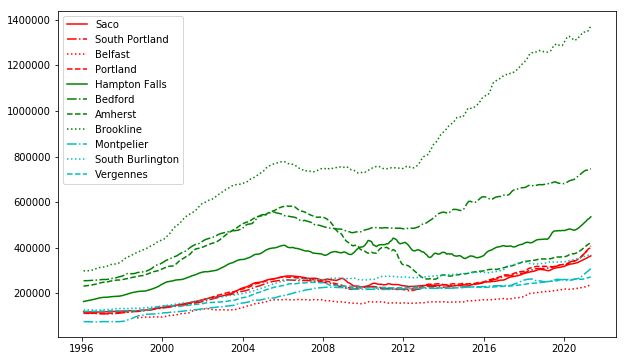

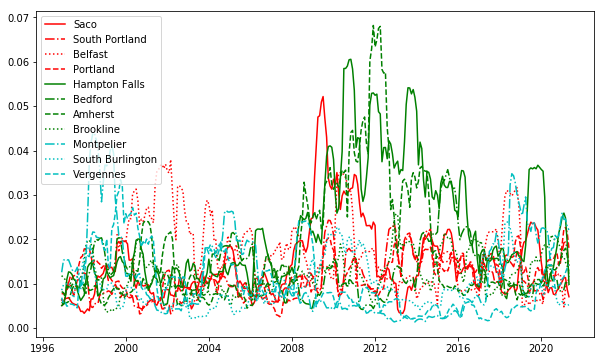

In [527]:
NE_N2_3bd = plot_house_price_1(NE_3bd, cities_North)
rolling_NE_N2_3bd = rolling_volatility(NE_N2_3bd, 10)
plot_city(rolling_NE_N2_3bd, cities_North)

<Figure size 720x432 with 0 Axes>

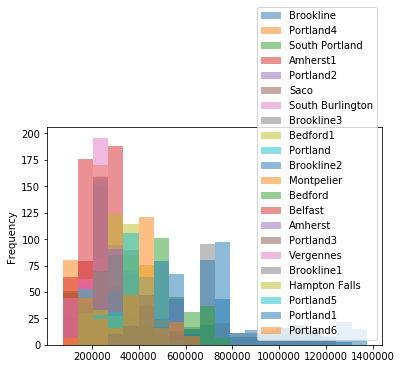

<Figure size 720x432 with 0 Axes>

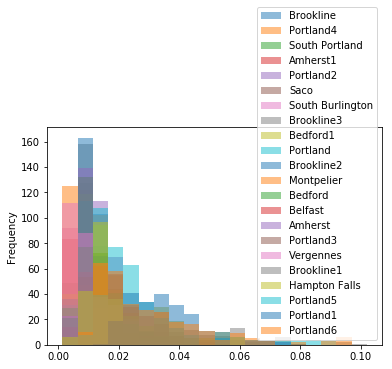

In [561]:
plot_hist(NE_N2_3bd)
plot_hist(rolling_NE_N2_3bd)

### 3.2.3 Compare 2 bedroom houses

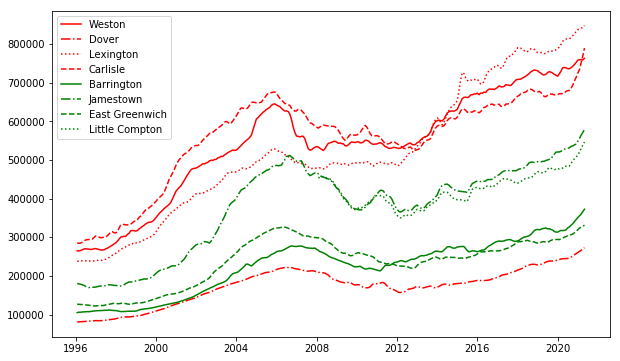

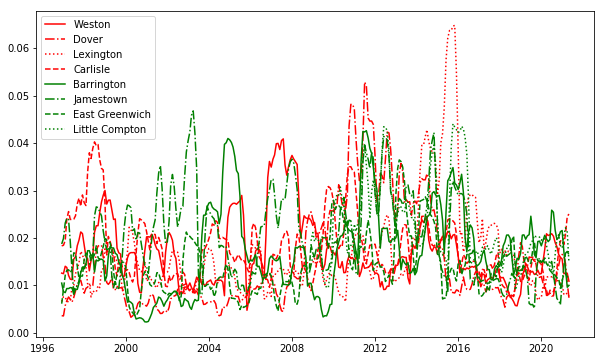

In [528]:
NE_S2_2bd = plot_house_price_1(NE_2bd, cities_South)
rolling_NE_S2_2bd = rolling_volatility(NE_S2_2bd, 10)
plot_city(rolling_NE_S2_2bd, cities_South)

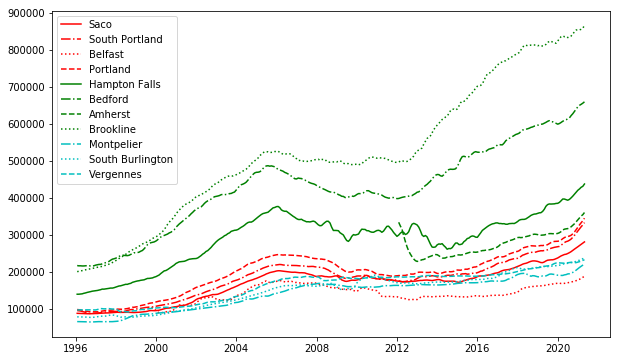

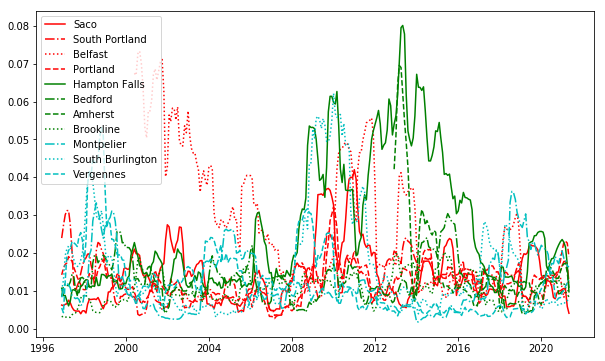

In [529]:
NE_N2_2bd = plot_house_price_1(NE_2bd, cities_North)
rolling_NE_N2_2bd = rolling_volatility(NE_N2_2bd, 10)
plot_city(rolling_NE_N2_2bd, cities_North)

<Figure size 720x432 with 0 Axes>

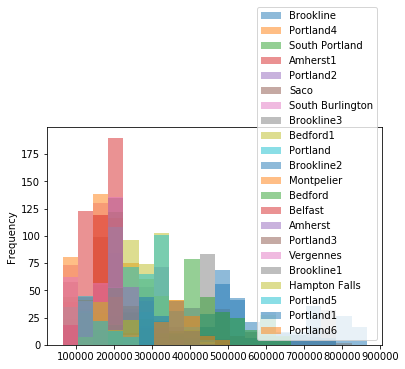

<Figure size 720x432 with 0 Axes>

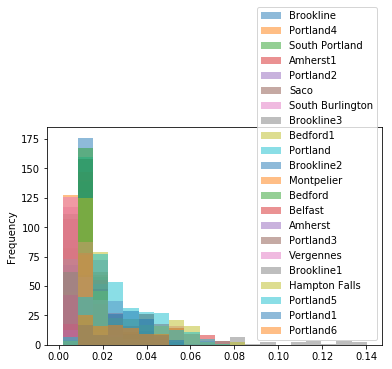

In [562]:
plot_hist(NE_N2_2bd)
plot_hist(rolling_NE_N2_2bd)

### 3.2.4 Compare 1 bedroom houses

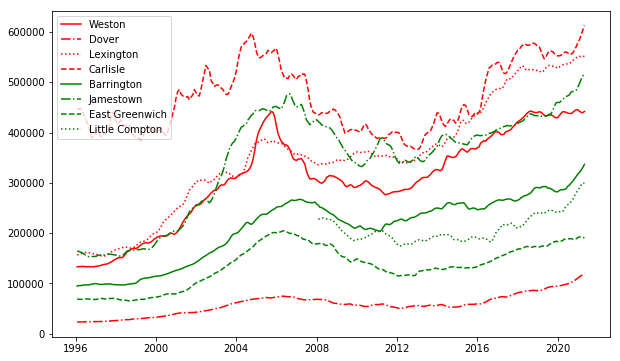

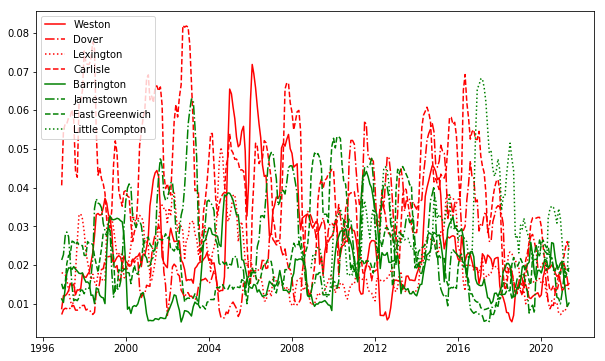

In [530]:
NE_S2_1bd = plot_house_price_1(NE_1bd, cities_South)
rolling_NE_S2_1bd = rolling_volatility(NE_S2_1bd, 10)
plot_city(rolling_NE_S2_1bd, cities_South)

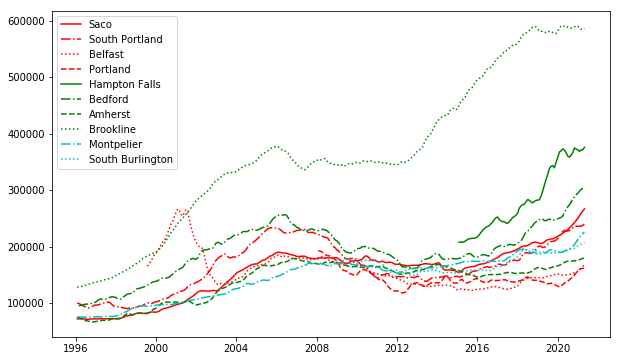

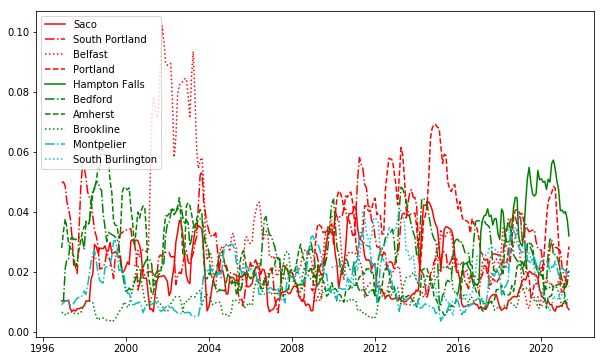

In [531]:
NE_N2_1bd = plot_house_price_1(NE_1bd, cities_North)
rolling_NE_N2_1bd = rolling_volatility(NE_N2_1bd, 10)
plot_city(rolling_NE_N2_1bd, cities_North)

### 3.2.5 Compare single houses

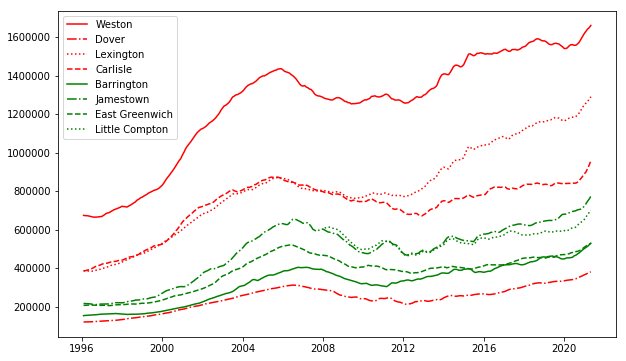

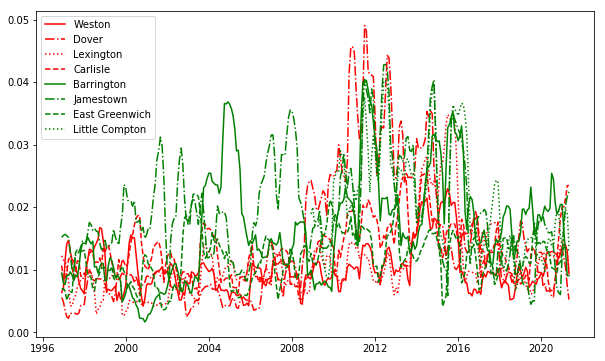

In [532]:
NE_S2_single = plot_house_price_1(NE_single, cities_South)
rolling_NE_S2_single = rolling_volatility(NE_S2_single, 10)
plot_city(rolling_NE_S2_single, cities_South)

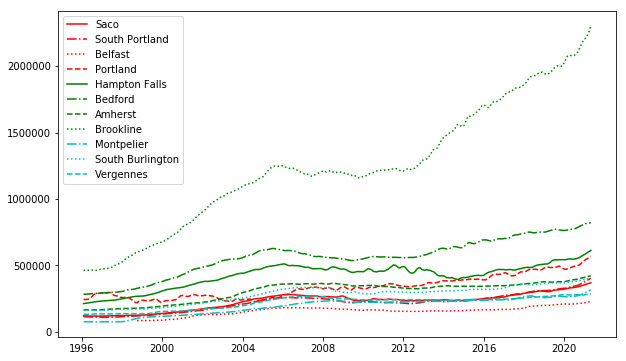

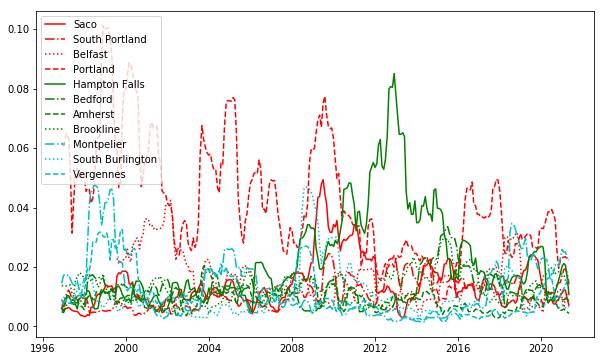

In [533]:
NE_N2_single = plot_house_price_1(NE_single, cities_North)
rolling_NE_N2_single = rolling_volatility(NE_N2_single, 10)
plot_city(rolling_NE_N2_single, cities_North)

<Figure size 720x432 with 0 Axes>

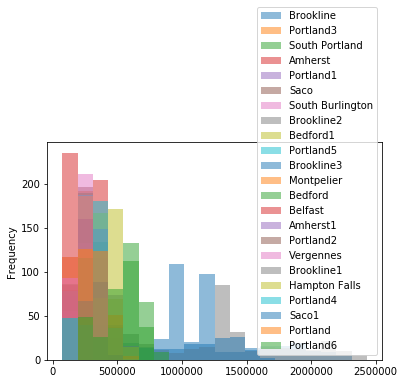

<Figure size 720x432 with 0 Axes>

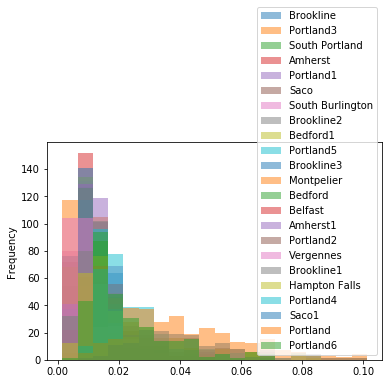

In [563]:
plot_hist(NE_N2_single)
plot_hist(rolling_NE_N2_single)

### 3.2.6 Compare condo houses

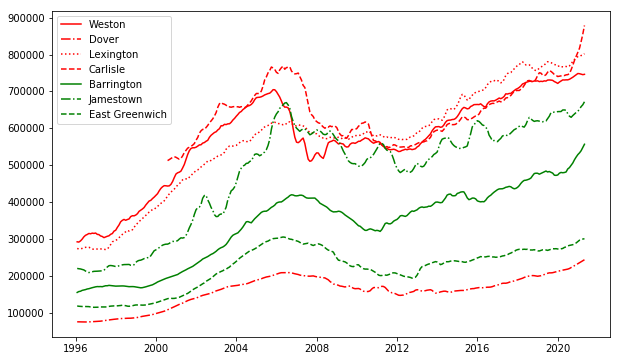

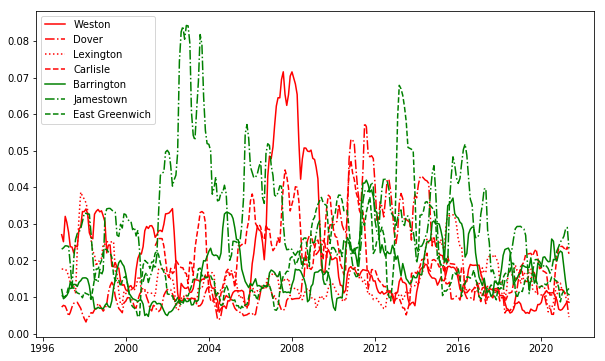

In [534]:
NE_S2_condo = plot_house_price_1(NE_condo, cities_South)
rolling_NE_S2_condo = rolling_volatility(NE_S2_condo, 10)
plot_city(rolling_NE_S2_condo, cities_South)

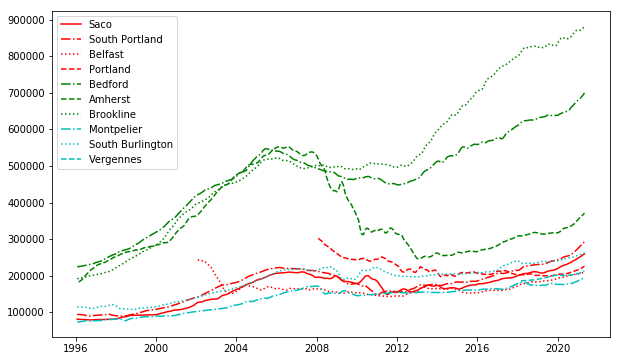

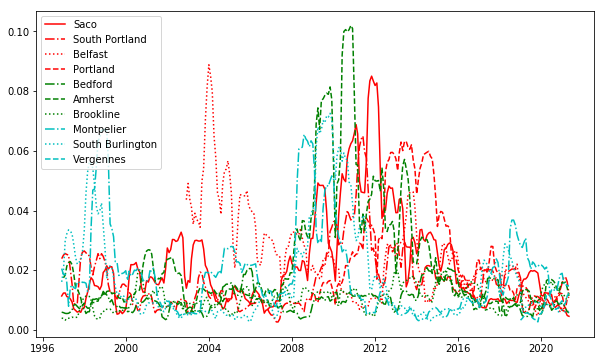

In [535]:
NE_N2_condo = plot_house_price_1(NE_condo, cities_North)
rolling_NE_N2_condo = rolling_volatility(NE_N2_condo, 10)
plot_city(rolling_NE_N2_condo, cities_North)

### 3.2.7 Compare top-priced houses

/Users/bouyang/Documents/virtualenv/atlas/lib/python3.7/site-packages/pandas/core/frame.py:4025: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


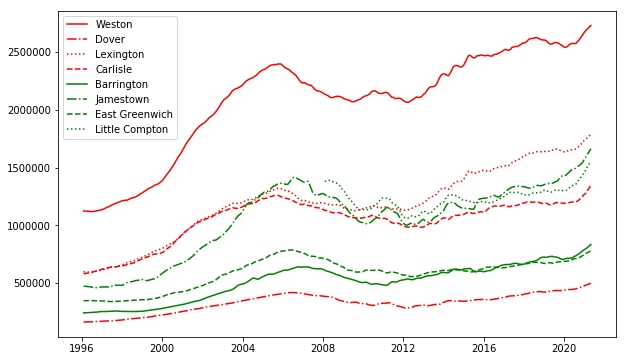

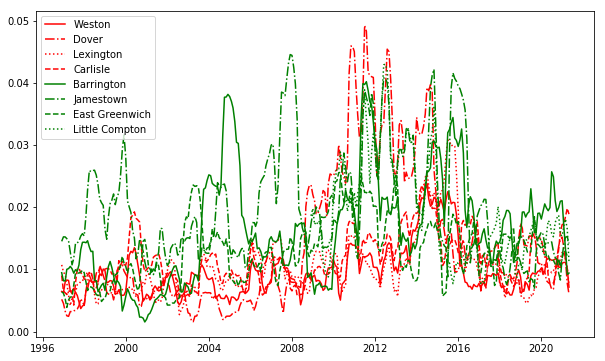

In [540]:
NE_S2_top = plot_house_price_2(NE_top, cities_South)
rolling_NE_S2_top = rolling_volatility(NE_S2_top, 10)
plot_city(rolling_NE_S2_top, cities_South)

<Figure size 720x432 with 0 Axes>

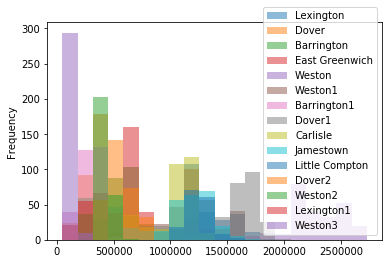

<Figure size 720x432 with 0 Axes>

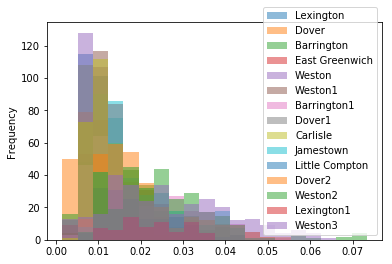

In [564]:
plot_hist(NE_S2_top)
plot_hist(rolling_NE_S2_top)

/Users/bouyang/Documents/virtualenv/atlas/lib/python3.7/site-packages/pandas/core/frame.py:4025: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


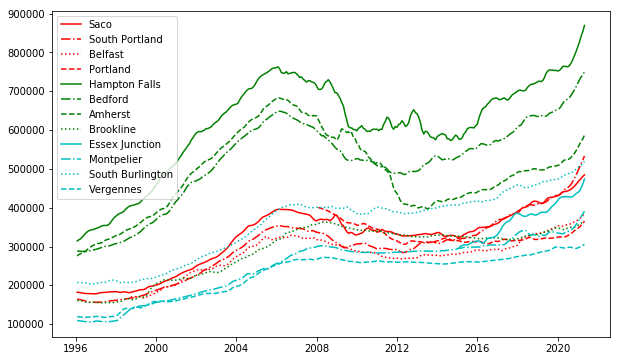

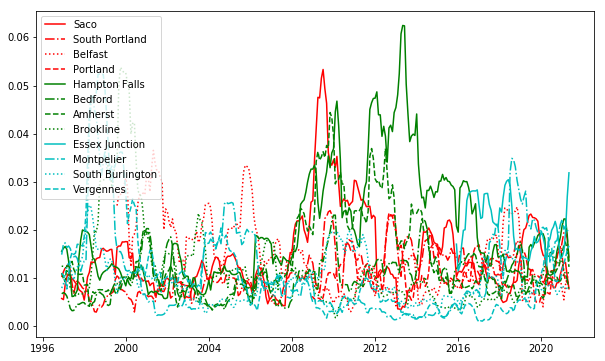

In [541]:
NE_N2_top = plot_house_price_2(NE_top, cities_North)
rolling_NE_N2_top = rolling_volatility(NE_N2_top, 10)
plot_city(rolling_NE_N2_top, cities_North)

### 3.2.8 Compare bottom-priced houses

/Users/bouyang/Documents/virtualenv/atlas/lib/python3.7/site-packages/pandas/core/frame.py:4025: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


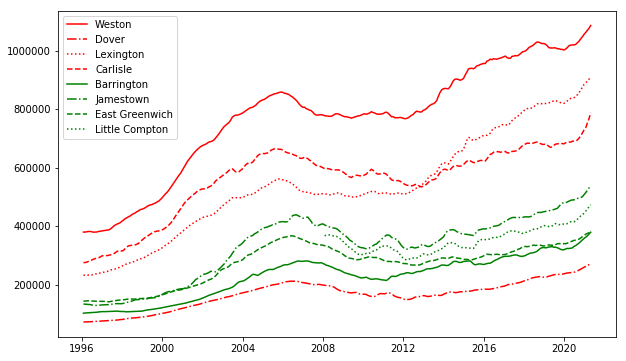

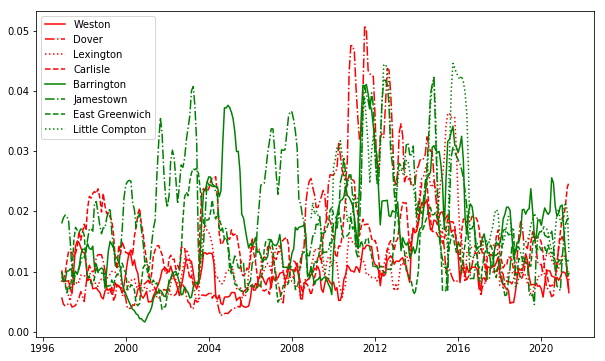

In [542]:
NE_S2_bottom = plot_house_price_2(NE_bottom, cities_South)
rolling_NE_S2_bottom = rolling_volatility(NE_S2_bottom, 10)
plot_city(rolling_NE_S2_bottom, cities_South)

/Users/bouyang/Documents/virtualenv/atlas/lib/python3.7/site-packages/pandas/core/frame.py:4025: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


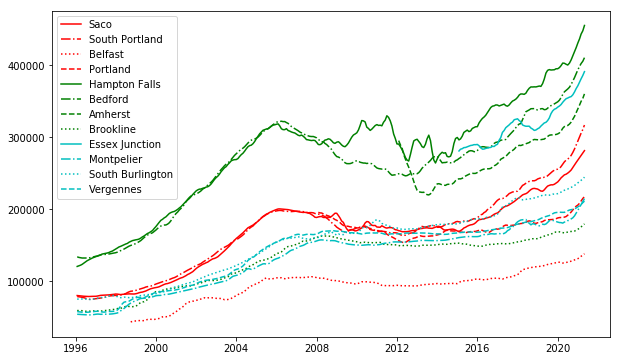

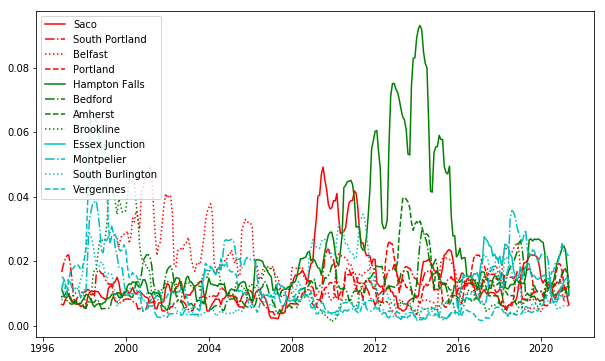

In [543]:
NE_N2_bottom = plot_house_price_2(NE_bottom, cities_North)
rolling_NE_N2_bottom = rolling_volatility(NE_N2_bottom, 10)
plot_city(rolling_NE_N2_bottom, cities_North)

<Figure size 720x432 with 0 Axes>

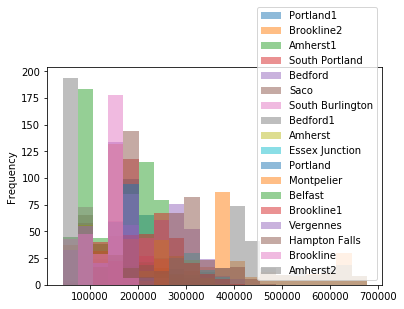

<Figure size 720x432 with 0 Axes>

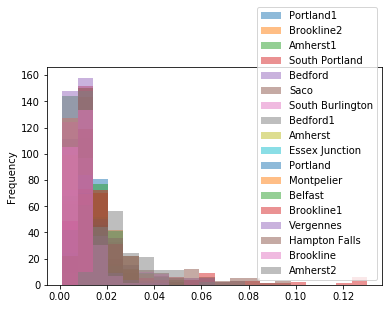

In [565]:
plot_hist(NE_N2_bottom)
plot_hist(rolling_NE_N2_bottom)

### 3.3 Compare house prices in VT & NH
* VT and NH are chosen because they have similar simple economic patterns, and the factors impacting their house prices are easily separable compared to other more developed and complex states.

1. School district with mid & high schools rated 9/10 at greatschools.org.
2. School district with mid & high schools rated 8/10 and under.
3. Scenary area without good public schools.
4. Metropolis.

* Hanover - 1
* Norwich - 1
* Stowe - 1
* Bedford - 1 & 4
* Lebanon - 2
* Hartford - 2
* Plymouth - 2
* Warner - 2
* Burlington - 2 & 4
* Nashua - 2 & 4
* Manchester - 2 & 4
* Merrimack - 2 & 4
* Portsmouth - 3
* Salem - 3
* Windsor - 3
* Woodstock - 3

cities_school = ['Hanover', 'Norwich', 'Stowe', 'Bedford'] <br />
cities_normal = ['Lebanon', 'Hartford', 'Plymouth', 'Warner'] <br />
cities_large = ['Burlington', 'Nashua', 'Manchester', 'Merrimack'] <br />
cities_scene = ['Portsmouth', 'Salem', 'Windsor', 'Woodstock'] <br />

### 3.3.1 Compare 4 bedroom houses

In [569]:
cities = ['', 'Hanover', 'Norwich', 'Stowe', 'Bedford', 'Lebanon', 'Hartford', 'Plymouth', 'Warner', 'Burlington', 'Nashua', 'Manchester', 'Merrimack', 'Portsmouth', 'Salem', 'Windsor', 'Woodstock']

cities_school2 = ['Hanover', 'Norwich', 'Stowe', 'Bedford']
cities_normal2 = ['Lebanon', 'Hartford', 'Plymouth', 'Warner']
cities_large2 = ['Burlington', 'Nashua', 'Manchester', 'Merrimack']
cities_scene2 = ['Portsmouth', 'Salem', 'Windsor', 'Woodstock']

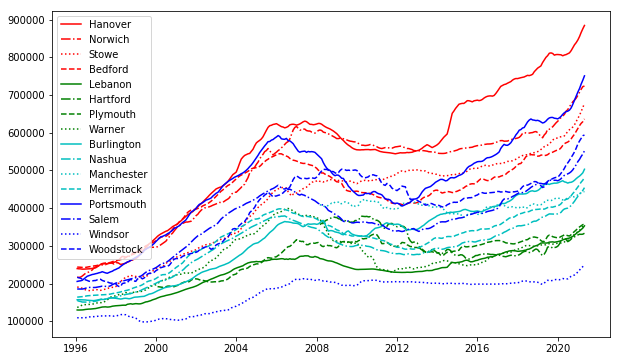

In [461]:
output_4bd = plot_house_price_1(VTNH_4bd, cities)

In [462]:
rolling_4bd = rolling_volatility(output_4bd, 10)

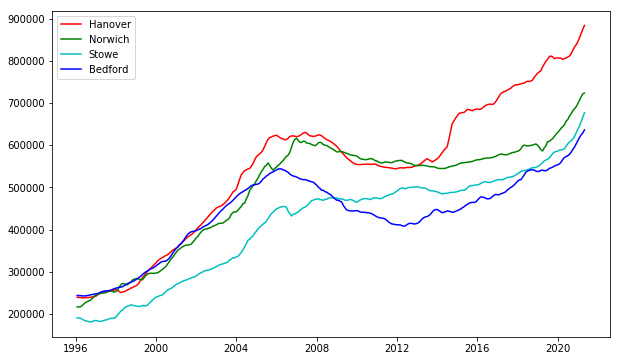

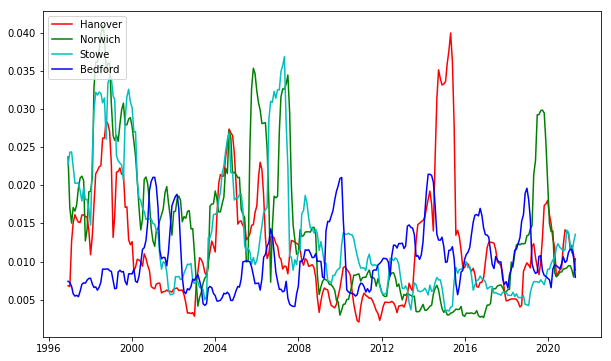

In [463]:
plot_city(output_4bd, cities_school)
plot_city(rolling_4bd, cities_school)

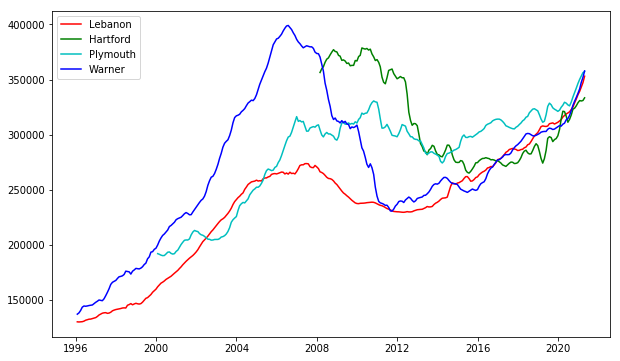

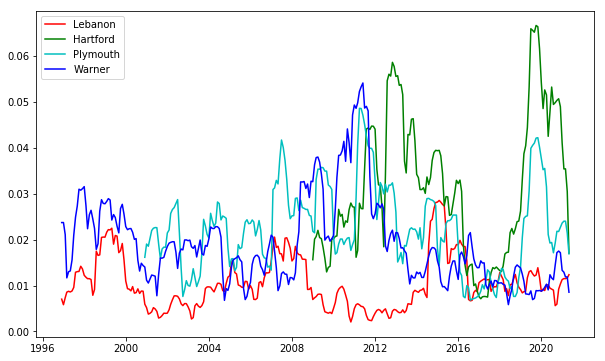

In [464]:
plot_city(output_4bd, cities_normal)
plot_city(rolling_4bd, cities_normal)

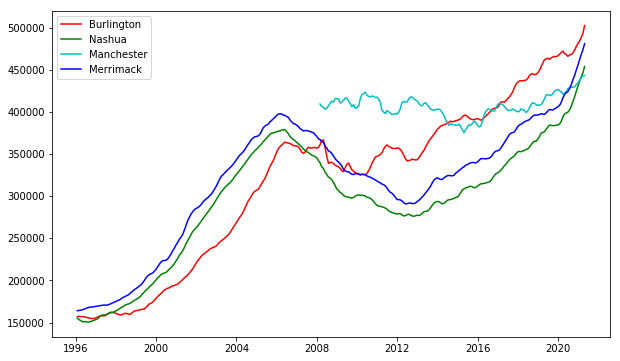

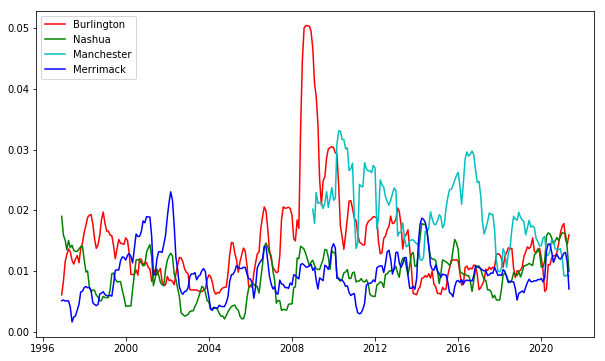

In [465]:
plot_city(output_4bd, cities_large)
plot_city(rolling_4bd, cities_large)

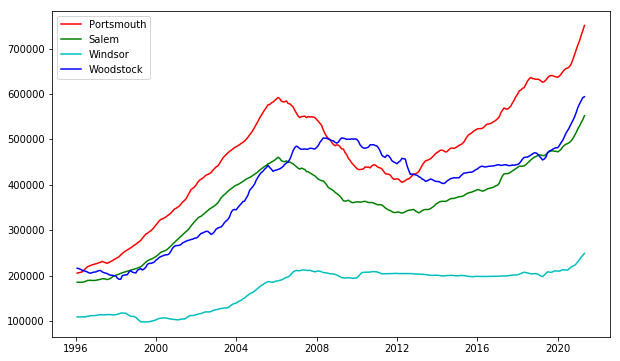

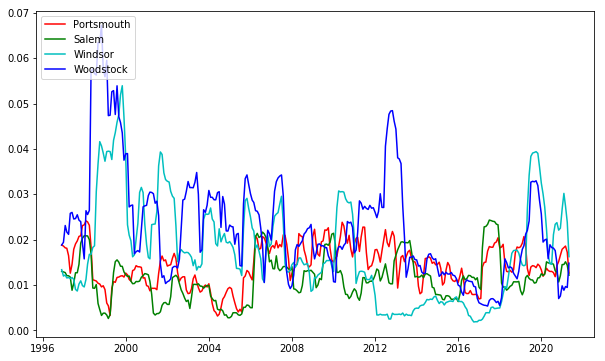

In [466]:
plot_city(output_4bd, cities_scene)
plot_city(rolling_4bd, cities_scene)

<Figure size 720x432 with 0 Axes>

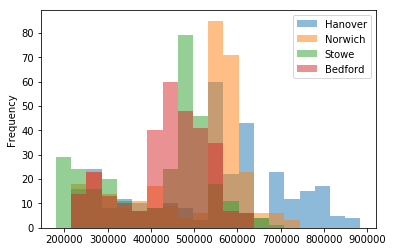

<Figure size 720x432 with 0 Axes>

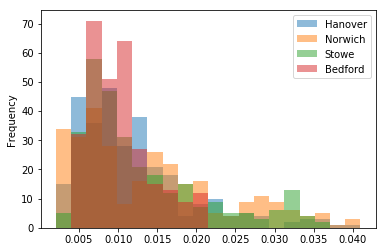

In [570]:
plot_hist(output_4bd[cities_school2])
plot_hist(rolling_4bd[cities_school2])

<Figure size 720x432 with 0 Axes>

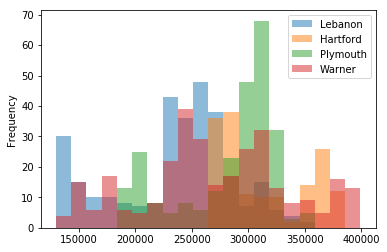

<Figure size 720x432 with 0 Axes>

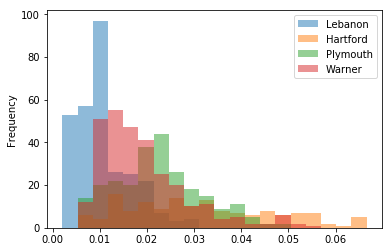

In [571]:
plot_hist(output_4bd[cities_normal2])
plot_hist(rolling_4bd[cities_normal2])

<Figure size 720x432 with 0 Axes>

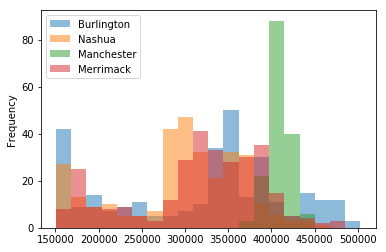

<Figure size 720x432 with 0 Axes>

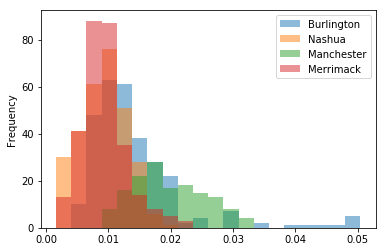

In [572]:
plot_hist(output_4bd[cities_large2])
plot_hist(rolling_4bd[cities_large2])

<Figure size 720x432 with 0 Axes>

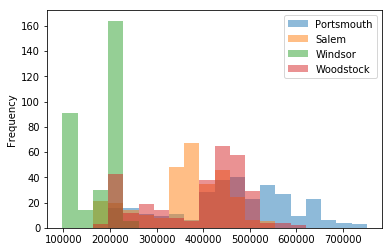

<Figure size 720x432 with 0 Axes>

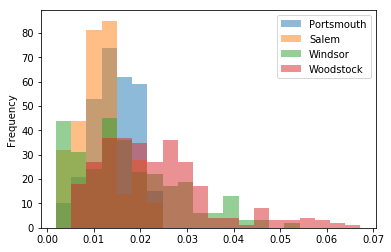

In [573]:
plot_hist(output_4bd[cities_scene2])
plot_hist(rolling_4bd[cities_scene2])

### 3.3.2 Compare 3 bedroom houses

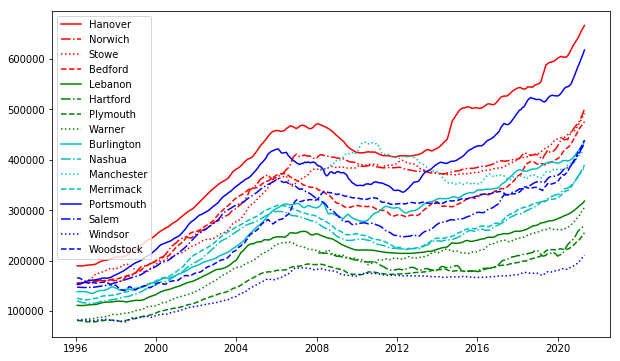

In [467]:
output_3bd = plot_house_price_1(VTNH_3bd, cities)

In [468]:
rolling_3bd = rolling_volatility(output_3bd, 10)

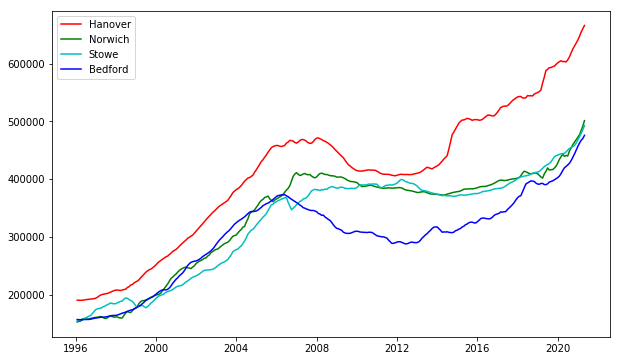

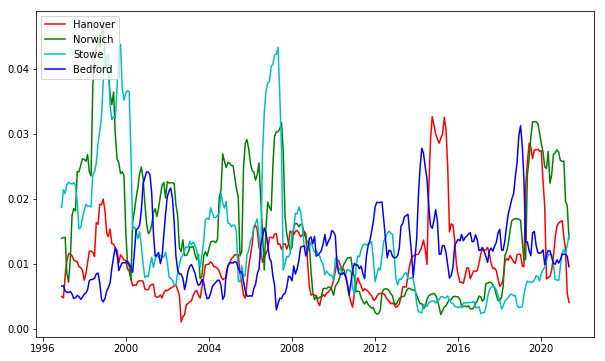

In [469]:
plot_city(output_3bd, cities_school)
plot_city(rolling_3bd, cities_school)

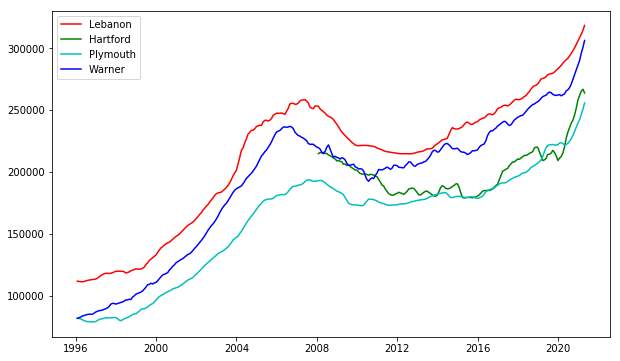

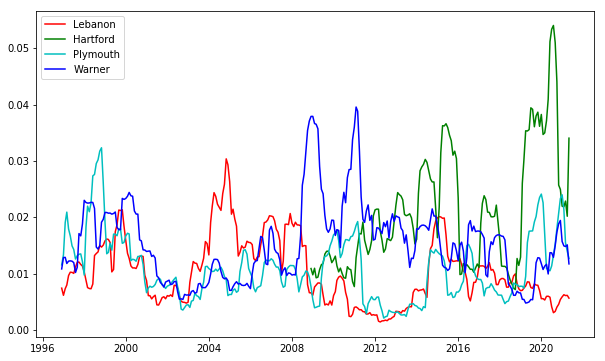

In [470]:
plot_city(output_3bd, cities_normal)
plot_city(rolling_3bd, cities_normal)

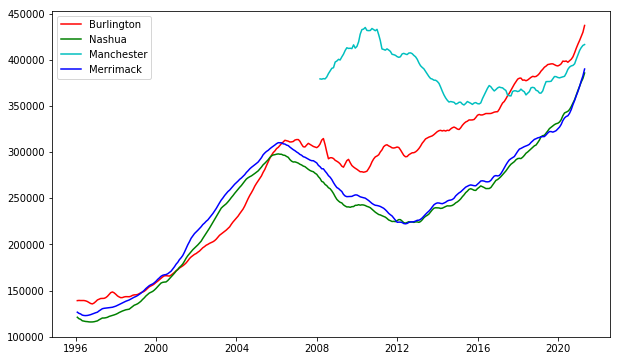

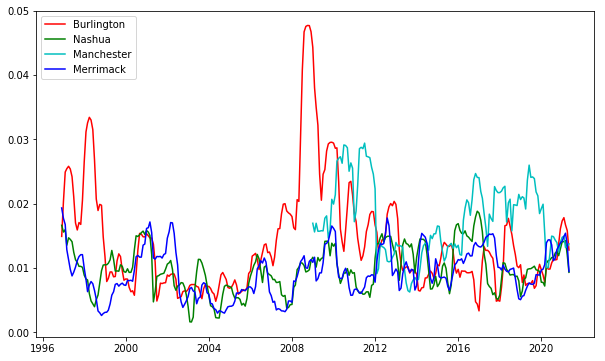

In [471]:
plot_city(output_3bd, cities_large)
plot_city(rolling_3bd, cities_large)

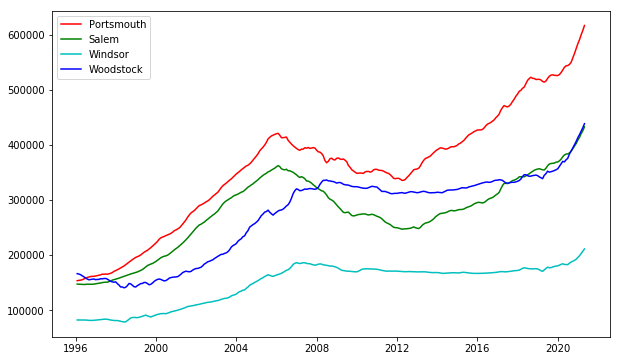

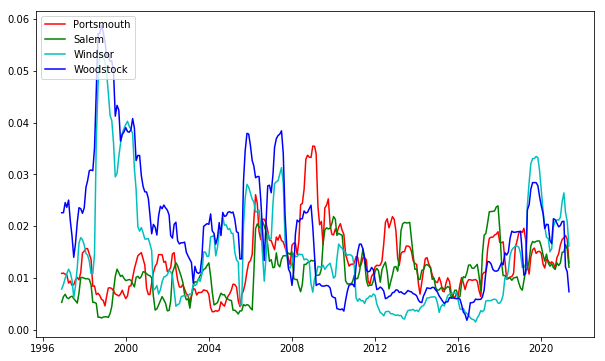

In [472]:
plot_city(output_3bd, cities_scene)
plot_city(rolling_3bd, cities_scene)

<Figure size 720x432 with 0 Axes>

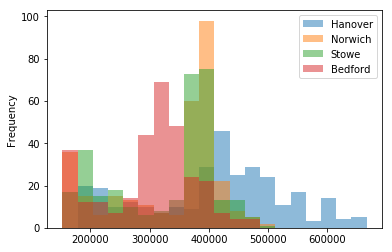

<Figure size 720x432 with 0 Axes>

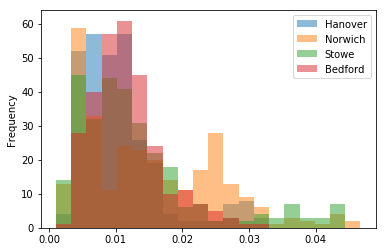

In [574]:
plot_hist(output_3bd[cities_school2])
plot_hist(rolling_3bd[cities_school2])

<Figure size 720x432 with 0 Axes>

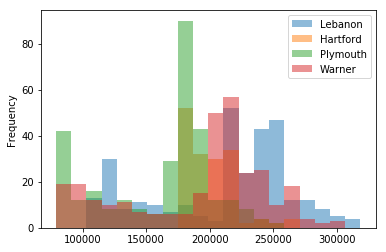

<Figure size 720x432 with 0 Axes>

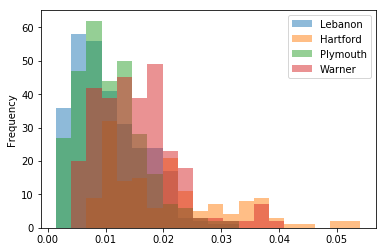

In [575]:
plot_hist(output_3bd[cities_normal2])
plot_hist(rolling_3bd[cities_normal2])

<Figure size 720x432 with 0 Axes>

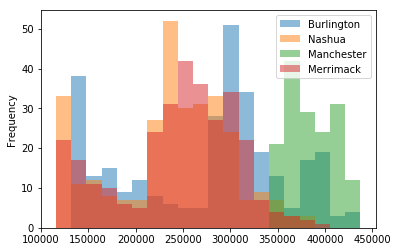

<Figure size 720x432 with 0 Axes>

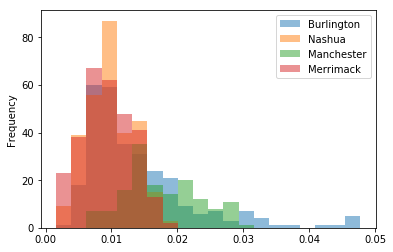

In [576]:
plot_hist(output_3bd[cities_large2])
plot_hist(rolling_3bd[cities_large2])

<Figure size 720x432 with 0 Axes>

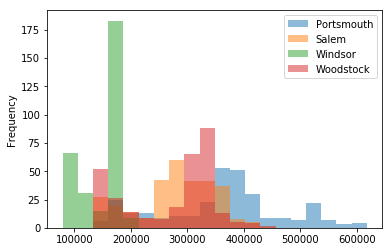

<Figure size 720x432 with 0 Axes>

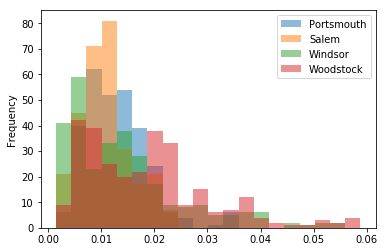

In [577]:
plot_hist(output_3bd[cities_scene2])
plot_hist(rolling_3bd[cities_scene2])

### 3.3.3 Compare 2 bedroom houses

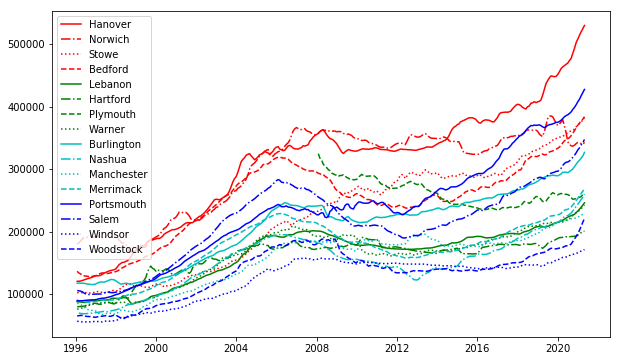

In [473]:
output_2bd = plot_house_price_1(VTNH_2bd, cities)

In [474]:
rolling_2bd = rolling_volatility(output_2bd, 10)

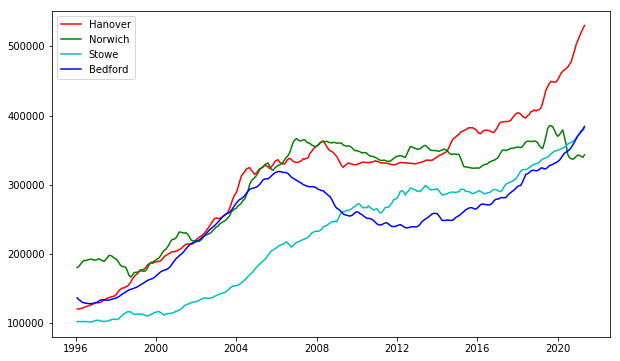

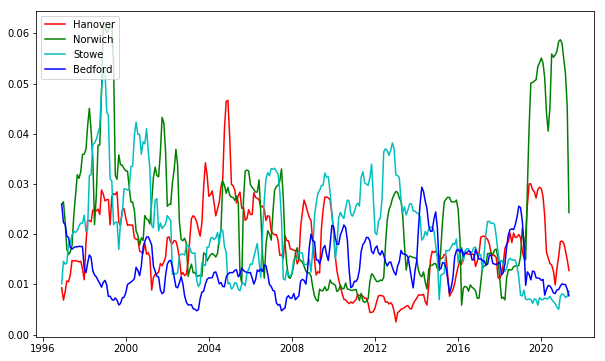

In [475]:
plot_city(output_2bd, cities_school)
plot_city(rolling_2bd, cities_school)

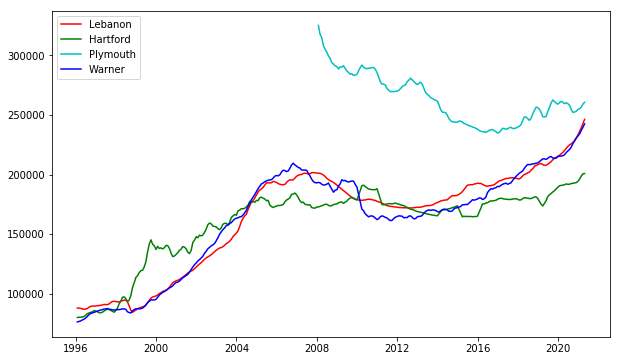

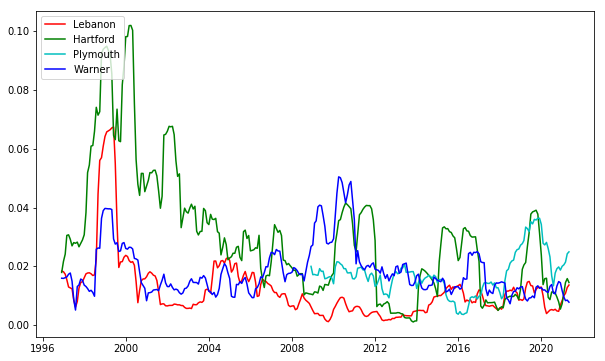

In [455]:
plot_city(output_2bd, cities_normal)
plot_city(rolling_2bd, cities_normal)

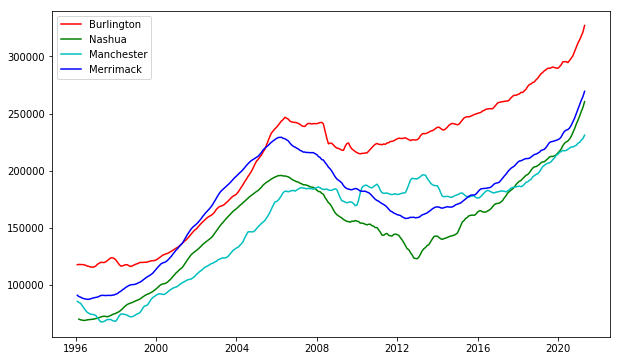

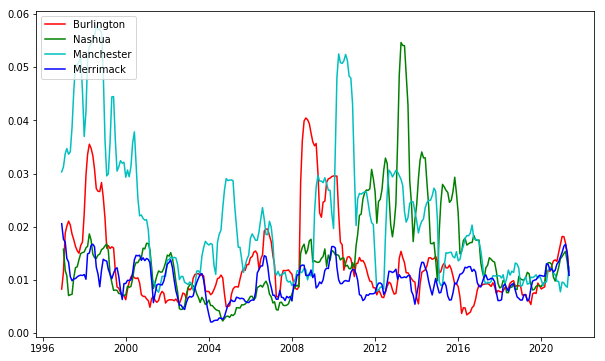

In [476]:
plot_city(output_2bd, cities_large)
plot_city(rolling_2bd, cities_large)

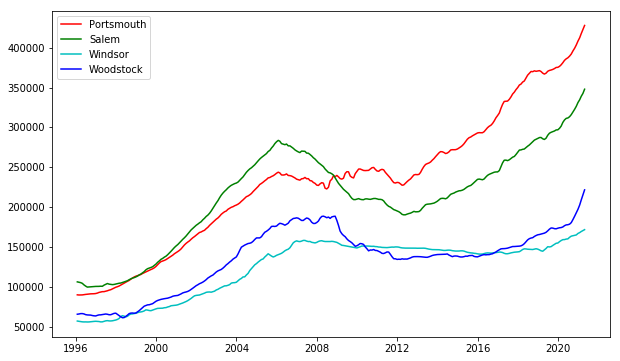

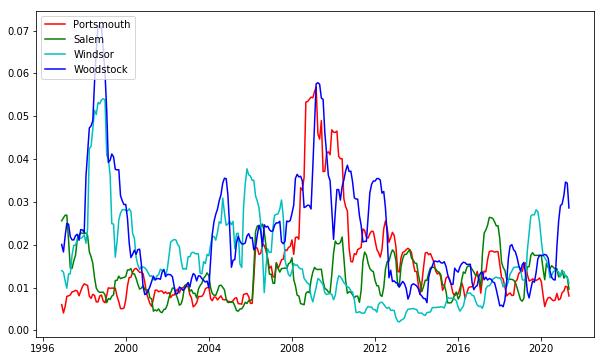

In [477]:
plot_city(output_2bd, cities_scene)
plot_city(rolling_2bd, cities_scene)

### 3.3.4 Compare 1 bedroom houses

In [225]:
# Create plot data for multiple school districts
VTNH_1bd_multi = VTNH_1bd[VTNH_1bd['City'].isin(['Norwich', 'Hanover', 'Hartford', 'Lebanon', 'Nashua', 'Bedford', 'Salem', 'Stowe', 'Burlington', 'Woodstock', 'Windsor', 'Warner', 'Plymouth', 'Portsmouth', 'Manchester', 'Merrimack'])]

plt_VTNH_1bd_multi, look_up = create_plot_data(VTNH_1bd_multi)


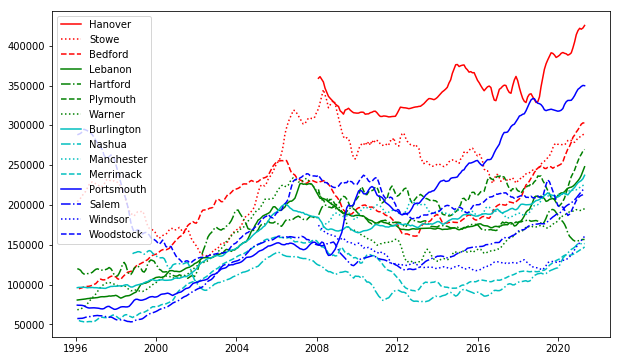

In [478]:
output_1bd = plot_house_price_1(VTNH_1bd, cities)

### 3.3.5 Compare condos

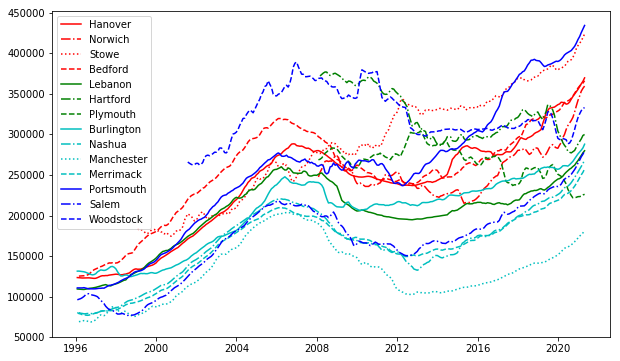

In [479]:
output_condo = plot_house_price_1(VTNH_condo, cities)

### 3.3.6 Compare single houses

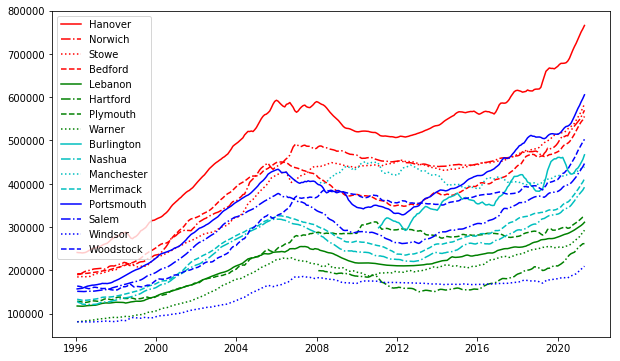

In [480]:
output_single = plot_house_price_1(VTNH_single, cities)

### 3.3.7 Compare top & bottom

/Users/bouyang/Documents/virtualenv/atlas/lib/python3.7/site-packages/pandas/core/frame.py:4025: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


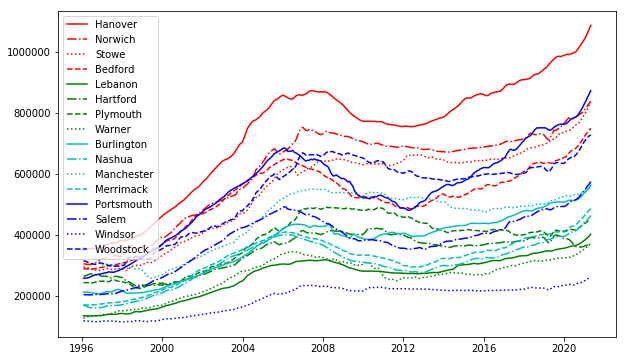

In [481]:
output_top = plot_house_price_2(VTNH_top, cities)

/Users/bouyang/Documents/virtualenv/atlas/lib/python3.7/site-packages/pandas/core/frame.py:4025: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


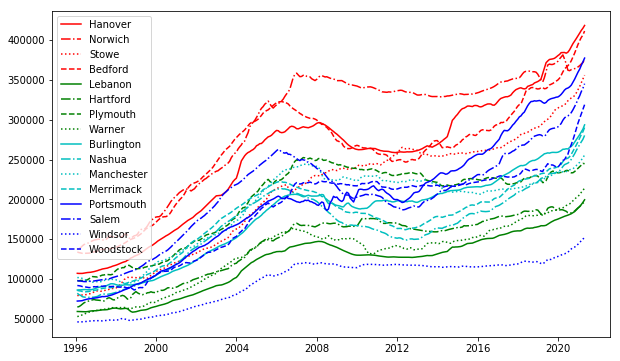

In [483]:
output_bottom = plot_house_price_2(VTNH_bottom, cities)